This work was done by:

Angela Speranza - angela.speranza@studio.unibo.it - 0001190011

Francesco Candoli - francesco.candoli@studio.unibo.it - 0001182302

# Assignment Module 2: Pet Classification

The goal of this assignment is to implement a neural network that classifies images of 37 breeds of cats and dogs from the [Oxford-IIIT-Pet dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/). The assignment is divided into two parts: first, you will be asked to implement from scratch your own neural network for image classification; then, you will fine-tune a pretrained network provided by PyTorch.

*The main code in the notebook has been formatted using Black Formatter*

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import CyclicLR
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models

import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import pandas as pd
import seaborn as sn

from pathlib import Path
from PIL import Image
from typing import List, Tuple, Dict

import os


# Dataset

The following cells contain the code to download and access the dataset you will be using in this assignment. Note that, although this dataset features each and every image from [Oxford-IIIT-Pet](https://www.robots.ox.ac.uk/~vgg/data/pets/), it uses a different train-val-test split than the original authors.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/CVLAB-Unibo/ipcv-assignment-2.git

Cloning into 'ipcv-assignment-2'...
remote: Enumerating objects: 7371, done.
remote: Total 7371 (delta 0), reused 0 (delta 0), pack-reused 7371 (from 1)
Receiving objects: 100% (7371/7371), 753.77 MiB | 17.75 MiB/s, done.
Updating files: 100% (7396/7396), done.


In [ ]:
class OxfordPetDataset(Dataset):
    def __init__(self, split: str, transform=None) -> None:
        super().__init__()

        self.root = Path("ipcv-assignment-2") / "dataset"
        self.split = split
        self.names, self.labels = self._get_names_and_labels()
        self.transform = transform

    def __len__(self) -> int:
        return len(self.labels)

    def __getitem__(self, idx) -> Tuple[torch.Tensor, int]:
        img_path = self.root / "images" / f"{self.names[idx]}.jpg"
        img = Image.open(img_path).convert("RGB")
        label = self.labels[idx]

        if self.transform:
            img = self.transform(img)

        return img, label

    def get_num_classes(self) -> int:
        return max(self.labels) + 1

    def _get_names_and_labels(self) -> Tuple[List[str], List[int]]:
        names = []
        labels = []

        with open(self.root / "annotations" / f"{self.split}.txt") as f:
            for line in f:
                name, label = line.replace("\n", "").split(" ")
                names.append(name),
                labels.append(int(label) - 1)

        return names, labels

In [ ]:
# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device.")

# Define transformations
# For training: resize, augment, convert to tensor, normalize
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize to slightly larger than input
    transforms.RandomCrop(224),     # Random crop to 224x224 (AlexNet input size)
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# For validation and testing: just resize, convert, and normalize
val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Create datasets
train_dataset = OxfordPetDataset(split='train', transform=train_transform)
val_dataset = OxfordPetDataset(split='val', transform=val_test_transform)
test_dataset = OxfordPetDataset(split='test', transform=val_test_transform)

print(f"Number of classes: {train_dataset.get_num_classes()}")
print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Test samples: {len(test_dataset)}")

# Create dataloaders
BATCH_SIZE = 64
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Using cuda device.
Number of classes: 37
Training samples: 3669
Validation samples: 1834
Test samples: 1846


# Part 1: design your own network

Your goal is to implement a convolutional neural network for image classification and train it from scratch on `OxfordPetDataset`. You should consider yourselves satisfied once you obtain a classification accuracy on the test split of ~60%. You are free to achieve this however you want, except for a few rules you must follow:

- Compile this notebook by displaying the results obtained by the best model you found throughout your experimentation; then show how, by removing some of its components, its performance drops. In other words, do an *ablation study* to prove that your design choices have a positive impact on the final result.

- Do not instantiate an off-the-self PyTorch network. Instead, construct your network as a composition of existing PyTorch layers. In more concrete terms, you can use e.g. `torch.nn.Linear`, but you cannot use e.g. `torchvision.models.alexnet`.

- Show your results and ablations with plots, tables, images, etc. — the clearer, the better.

Don't be too concerned with your model performance: the ~60% is just to give you an idea of when to stop. Keep in mind that a thoroughly justified model with lower accuracy will be rewarded more points than a poorly experimentally validated model with higher accuracy.

## Functions:
- train one epoch
- train loop
- evaluate
- load history from csv
- plot history

Unfortunately Free Colab allows to use limited resources, so we have to run trainings in different days. To handle this problem we save histories and model parameters in ours google drive folder.

In [ ]:
def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    for inputs, labels in tqdm(dataloader, desc="Training"):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        correct_predictions += (predicted == labels).sum().item()
        total_samples += labels.size(0)
    avg_loss = total_loss / total_samples
    accuracy = correct_predictions / total_samples
    return avg_loss, accuracy


def evaluate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    with torch.no_grad():
        for inputs, labels in tqdm(dataloader, desc="Validation"):
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            correct_predictions += (predicted == labels).sum().item()
            total_samples += labels.size(0)
    avg_loss = total_loss / total_samples
    accuracy = correct_predictions / total_samples
    return avg_loss, accuracy


def train_loop(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    epochs,
    device,
    save_dir,
    model_name,
    early_stopping_patience=10,
):
    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
        "learning_rate": [],
    }
    best_val_acc = 0.0
    epochs_no_improve = 0

    os.makedirs(save_dir, exist_ok=True)

    model_path = os.path.join(save_dir, f"best_{model_name}.pth")
    csv_path = os.path.join(save_dir, f"history_{model_name}.csv")

    for epoch in range(epochs):
        print(f"--- Epoch {epoch+1}/{epochs} ---")
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device
        )
        val_loss, val_acc = evaluate(model, val_loader, criterion, device)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        # Get current learning rate before scheduler step

        current_lr = optimizer.param_groups[0]["lr"]
        history["learning_rate"].append(current_lr)

        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
        # print(f"Learning Rate: {current_lr:.6f}") #DEBUG

        # Step the scheduler with validation loss

        if scheduler is not None:
            scheduler.step(val_loss)

            new_lr = optimizer.param_groups[0]["lr"]
            if new_lr != current_lr:
                print(
                    f">>> Learning rate changed from {current_lr:.6f} to {new_lr:.6f}"
                )
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            epochs_no_improve = 0
            torch.save(model.state_dict(), model_path)
            print(f"New best model saved with accuracy: {best_val_acc:.4f}")
        else:
            epochs_no_improve += 1
            print(f"No improvement for {epochs_no_improve} epoch(s)")
        # Early stopping check

        if epochs_no_improve >= early_stopping_patience:
            print(
                f"\nEarly stopping triggered after {epoch+1} epochs (no improvement for {early_stopping_patience} epochs)"
            )
            break
    print("Training finished.")

    # Save history to CSV

    try:
        df = pd.DataFrame(history)
        df.insert(0, "epoch", range(1, len(df) + 1))

        df.to_csv(csv_path, index=False)
        print(f"\nTraining history saved to: {csv_path}")
        print(f"Best validation accuracy: {best_val_acc:.4f}")
    except Exception as e:
        print(f"Warning: Could not save history to CSV: {e}")
    return history


In [ ]:
def load_history_from_csv(csv_path: str):
    df = pd.read_csv(csv_path)

    history = {
        "train_loss": df["train_loss"].tolist(),
        "train_acc": df["train_acc"].tolist(),
        "val_loss": df["val_loss"].tolist(),
        "val_acc": df["val_acc"].tolist(),
    }

    if "learning_rate" in df.columns:
        history["learning_rate"] = df["learning_rate"].tolist()
    return history


In [ ]:
def plot_history(history: Dict[str, List[float]], title: str):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    ax1.plot(history["train_loss"], label="Train Loss")
    ax1.plot(history["val_loss"], label="Validation Loss")
    ax1.set_title(f"{title} - Loss Curves")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.legend()

    ax2.plot(history["train_acc"], label="Train Accuracy")
    ax2.plot(history["val_acc"], label="Validation Accuracy")
    ax2.set_title(f"{title} - Accuracy Curves")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Accuracy")
    ax2.legend()

    plt.show()


## My Model

In [ ]:
class MyModel(nn.Module):

    def __init__(self, num_classes: int = 37):
        super().__init__()

        # Feature extraction layers

        self.features = nn.Sequential(
            # First conv block - 32 channels
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Second conv block - 64 channels
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Third conv block - 128 channels
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout2d(0.4),

            # Fourth conv block - 256 channels
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Fifth conv block - 512 channels
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # Classifier layers

        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes),
        )
        # Initialize weights

        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


In [ ]:
model = MyModel(num_classes=train_dataset.get_num_classes()).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay=2e-4)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=7, min_lr=1e-7, threshold=1e-4
)

myModel_history = train_loop(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    200,
    device,
    "drive/MyDrive/AssignmentsIPCV",
    model_name="MyModel",
)


--- Epoch 1/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.5867, Train Acc: 0.0346
Val Loss: 3.6554, Val Acc: 0.0349
Learning Rate: 0.001000
New best model saved with accuracy: 0.0349
--- Epoch 2/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.5237, Train Acc: 0.0392
Val Loss: 3.7354, Val Acc: 0.0267
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 3/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.5117, Train Acc: 0.0403
Val Loss: 3.6643, Val Acc: 0.0322
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 4/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4909, Train Acc: 0.0504
Val Loss: 3.5139, Val Acc: 0.0523
Learning Rate: 0.001000
New best model saved with accuracy: 0.0523
--- Epoch 5/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4880, Train Acc: 0.0452
Val Loss: 3.5159, Val Acc: 0.0480
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 6/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4711, Train Acc: 0.0496
Val Loss: 3.5190, Val Acc: 0.0589
Learning Rate: 0.001000
New best model saved with accuracy: 0.0589
--- Epoch 7/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4708, Train Acc: 0.0561
Val Loss: 3.5450, Val Acc: 0.0393
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 8/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4550, Train Acc: 0.0589
Val Loss: 3.5978, Val Acc: 0.0513
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 9/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4331, Train Acc: 0.0608
Val Loss: 3.5067, Val Acc: 0.0507
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 10/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4151, Train Acc: 0.0654
Val Loss: 3.4471, Val Acc: 0.0780
Learning Rate: 0.001000
New best model saved with accuracy: 0.0780
--- Epoch 11/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3882, Train Acc: 0.0750
Val Loss: 3.6939, Val Acc: 0.0474
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 12/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3687, Train Acc: 0.0809
Val Loss: 3.7115, Val Acc: 0.0480
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 13/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3735, Train Acc: 0.0714
Val Loss: 3.4027, Val Acc: 0.0774
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 14/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3320, Train Acc: 0.0823
Val Loss: 3.4925, Val Acc: 0.0534
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 15/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3169, Train Acc: 0.0818
Val Loss: 3.4241, Val Acc: 0.0638
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 16/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2990, Train Acc: 0.0834
Val Loss: 3.4672, Val Acc: 0.0622
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 17/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2668, Train Acc: 0.0938
Val Loss: 3.5540, Val Acc: 0.0654
Learning Rate: 0.001000
No improvement for 7 epoch(s)
--- Epoch 18/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2752, Train Acc: 0.0940
Val Loss: 3.4977, Val Acc: 0.0643
Learning Rate: 0.001000
No improvement for 8 epoch(s)
--- Epoch 19/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2261, Train Acc: 0.1011
Val Loss: 3.3398, Val Acc: 0.0867
Learning Rate: 0.001000
New best model saved with accuracy: 0.0867
--- Epoch 20/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2168, Train Acc: 0.1085
Val Loss: 3.3068, Val Acc: 0.0894
Learning Rate: 0.001000
New best model saved with accuracy: 0.0894
--- Epoch 21/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2046, Train Acc: 0.1186
Val Loss: 3.4184, Val Acc: 0.0769
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 22/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1703, Train Acc: 0.1229
Val Loss: 3.2829, Val Acc: 0.1058
Learning Rate: 0.001000
New best model saved with accuracy: 0.1058
--- Epoch 23/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1366, Train Acc: 0.1278
Val Loss: 3.3823, Val Acc: 0.0878
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 24/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1185, Train Acc: 0.1267
Val Loss: 3.3379, Val Acc: 0.1020
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 25/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1370, Train Acc: 0.1286
Val Loss: 3.1927, Val Acc: 0.1210
Learning Rate: 0.001000
New best model saved with accuracy: 0.1210
--- Epoch 26/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1097, Train Acc: 0.1330
Val Loss: 3.4133, Val Acc: 0.0834
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 27/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0708, Train Acc: 0.1472
Val Loss: 3.1857, Val Acc: 0.1292
Learning Rate: 0.001000
New best model saved with accuracy: 0.1292
--- Epoch 28/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0495, Train Acc: 0.1551
Val Loss: 3.1646, Val Acc: 0.1298
Learning Rate: 0.001000
New best model saved with accuracy: 0.1298
--- Epoch 29/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0269, Train Acc: 0.1586
Val Loss: 3.4679, Val Acc: 0.0774
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 30/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0074, Train Acc: 0.1627
Val Loss: 3.1607, Val Acc: 0.1178
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 31/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9823, Train Acc: 0.1712
Val Loss: 3.2801, Val Acc: 0.1369
Learning Rate: 0.001000
New best model saved with accuracy: 0.1369
--- Epoch 32/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9603, Train Acc: 0.1892
Val Loss: 3.0605, Val Acc: 0.1636
Learning Rate: 0.001000
New best model saved with accuracy: 0.1636
--- Epoch 33/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9446, Train Acc: 0.1883
Val Loss: 3.0789, Val Acc: 0.1450
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 34/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8982, Train Acc: 0.1908
Val Loss: 3.2720, Val Acc: 0.1320
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 35/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8484, Train Acc: 0.2189
Val Loss: 3.1190, Val Acc: 0.1587
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 36/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8354, Train Acc: 0.2172
Val Loss: 3.1489, Val Acc: 0.1401
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 37/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7828, Train Acc: 0.2404
Val Loss: 2.9460, Val Acc: 0.1816
Learning Rate: 0.001000
New best model saved with accuracy: 0.1816
--- Epoch 38/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7691, Train Acc: 0.2456
Val Loss: 3.0153, Val Acc: 0.1832
Learning Rate: 0.001000
New best model saved with accuracy: 0.1832
--- Epoch 39/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7648, Train Acc: 0.2309
Val Loss: 2.9108, Val Acc: 0.2050
Learning Rate: 0.001000
New best model saved with accuracy: 0.2050
--- Epoch 40/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7086, Train Acc: 0.2617
Val Loss: 2.9402, Val Acc: 0.1968
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 41/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6798, Train Acc: 0.2676
Val Loss: 2.8491, Val Acc: 0.2312
Learning Rate: 0.001000
New best model saved with accuracy: 0.2312
--- Epoch 42/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6595, Train Acc: 0.2676
Val Loss: 2.9117, Val Acc: 0.2148
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 43/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6155, Train Acc: 0.2815
Val Loss: 2.7794, Val Acc: 0.2541
Learning Rate: 0.001000
New best model saved with accuracy: 0.2541
--- Epoch 44/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5948, Train Acc: 0.2982
Val Loss: 2.7842, Val Acc: 0.2497
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 45/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5286, Train Acc: 0.3118
Val Loss: 2.8782, Val Acc: 0.2110
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 46/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5098, Train Acc: 0.3235
Val Loss: 2.9605, Val Acc: 0.1892
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 47/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4841, Train Acc: 0.3243
Val Loss: 2.6914, Val Acc: 0.2786
Learning Rate: 0.001000
New best model saved with accuracy: 0.2786
--- Epoch 48/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4603, Train Acc: 0.3431
Val Loss: 2.6672, Val Acc: 0.2830
Learning Rate: 0.001000
New best model saved with accuracy: 0.2830
--- Epoch 49/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4230, Train Acc: 0.3570
Val Loss: 2.6026, Val Acc: 0.2983
Learning Rate: 0.001000
New best model saved with accuracy: 0.2983
--- Epoch 50/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3948, Train Acc: 0.3756
Val Loss: 2.6038, Val Acc: 0.3032
Learning Rate: 0.001000
New best model saved with accuracy: 0.3032
--- Epoch 51/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3700, Train Acc: 0.3682
Val Loss: 2.5354, Val Acc: 0.3190
Learning Rate: 0.001000
New best model saved with accuracy: 0.3190
--- Epoch 52/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3193, Train Acc: 0.3903
Val Loss: 2.4559, Val Acc: 0.3381
Learning Rate: 0.001000
New best model saved with accuracy: 0.3381
--- Epoch 53/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2753, Train Acc: 0.4031
Val Loss: 2.8004, Val Acc: 0.3032
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 54/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2759, Train Acc: 0.3957
Val Loss: 2.4975, Val Acc: 0.3299
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 55/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2470, Train Acc: 0.4295
Val Loss: 2.4934, Val Acc: 0.3261
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 56/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2192, Train Acc: 0.4159
Val Loss: 2.5035, Val Acc: 0.3517
Learning Rate: 0.001000
New best model saved with accuracy: 0.3517
--- Epoch 57/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2014, Train Acc: 0.4334
Val Loss: 2.4547, Val Acc: 0.3495
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 58/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1772, Train Acc: 0.4410
Val Loss: 2.3526, Val Acc: 0.3920
Learning Rate: 0.001000
New best model saved with accuracy: 0.3920
--- Epoch 59/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1378, Train Acc: 0.4584
Val Loss: 2.3399, Val Acc: 0.3948
Learning Rate: 0.001000
New best model saved with accuracy: 0.3948
--- Epoch 60/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1165, Train Acc: 0.4691
Val Loss: 2.5664, Val Acc: 0.2988
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 61/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1031, Train Acc: 0.4710
Val Loss: 2.4996, Val Acc: 0.3495
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 62/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1175, Train Acc: 0.4718
Val Loss: 2.3880, Val Acc: 0.3642
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 63/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.0581, Train Acc: 0.5056
Val Loss: 2.4653, Val Acc: 0.3610
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 64/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.0494, Train Acc: 0.5091
Val Loss: 2.2597, Val Acc: 0.4335
Learning Rate: 0.001000
New best model saved with accuracy: 0.4335
--- Epoch 65/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.0144, Train Acc: 0.5159
Val Loss: 2.4238, Val Acc: 0.3795
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 66/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9920, Train Acc: 0.5252
Val Loss: 2.3217, Val Acc: 0.3926
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 67/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9945, Train Acc: 0.5372
Val Loss: 2.2719, Val Acc: 0.4122
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 68/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9583, Train Acc: 0.5506
Val Loss: 2.2038, Val Acc: 0.4427
Learning Rate: 0.001000
New best model saved with accuracy: 0.4427
--- Epoch 69/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9452, Train Acc: 0.5487
Val Loss: 2.2935, Val Acc: 0.3937
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 70/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9204, Train Acc: 0.5606
Val Loss: 2.2250, Val Acc: 0.4395
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 71/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9030, Train Acc: 0.5628
Val Loss: 2.2373, Val Acc: 0.4318
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 72/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8914, Train Acc: 0.5754
Val Loss: 2.2737, Val Acc: 0.4455
Learning Rate: 0.001000
New best model saved with accuracy: 0.4455
--- Epoch 73/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8805, Train Acc: 0.5800
Val Loss: 2.1301, Val Acc: 0.4684
Learning Rate: 0.001000
New best model saved with accuracy: 0.4684
--- Epoch 74/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8433, Train Acc: 0.6034
Val Loss: 2.1188, Val Acc: 0.4771
Learning Rate: 0.001000
New best model saved with accuracy: 0.4771
--- Epoch 75/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8351, Train Acc: 0.5955
Val Loss: 2.8776, Val Acc: 0.2775
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 76/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8162, Train Acc: 0.6013
Val Loss: 2.1139, Val Acc: 0.4869
Learning Rate: 0.001000
New best model saved with accuracy: 0.4869
--- Epoch 77/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7771, Train Acc: 0.6340
Val Loss: 2.2303, Val Acc: 0.4684
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 78/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7713, Train Acc: 0.6239
Val Loss: 2.1115, Val Acc: 0.4978
Learning Rate: 0.001000
New best model saved with accuracy: 0.4978
--- Epoch 79/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7635, Train Acc: 0.6299
Val Loss: 2.1059, Val Acc: 0.4913
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 80/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7604, Train Acc: 0.6329
Val Loss: 2.0358, Val Acc: 0.5202
Learning Rate: 0.001000
New best model saved with accuracy: 0.5202
--- Epoch 81/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7182, Train Acc: 0.6577
Val Loss: 2.0034, Val Acc: 0.5185
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 82/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7009, Train Acc: 0.6560
Val Loss: 2.1150, Val Acc: 0.4896
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 83/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6980, Train Acc: 0.6560
Val Loss: 2.1332, Val Acc: 0.4804
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 84/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6611, Train Acc: 0.6808
Val Loss: 2.2564, Val Acc: 0.4329
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 85/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6778, Train Acc: 0.6705
Val Loss: 2.1875, Val Acc: 0.4553
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 86/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6304, Train Acc: 0.6969
Val Loss: 2.0096, Val Acc: 0.5158
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 87/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6264, Train Acc: 0.6920
Val Loss: 2.0892, Val Acc: 0.5098
Learning Rate: 0.001000
No improvement for 7 epoch(s)
--- Epoch 88/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6018, Train Acc: 0.7026
Val Loss: 1.9803, Val Acc: 0.5344
Learning Rate: 0.001000
New best model saved with accuracy: 0.5344
--- Epoch 89/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6121, Train Acc: 0.7035
Val Loss: 2.1383, Val Acc: 0.4858
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 90/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6064, Train Acc: 0.7013
Val Loss: 2.0432, Val Acc: 0.5169
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 91/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5737, Train Acc: 0.7144
Val Loss: 1.9818, Val Acc: 0.5442
Learning Rate: 0.001000
New best model saved with accuracy: 0.5442
--- Epoch 92/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5910, Train Acc: 0.7092
Val Loss: 2.1454, Val Acc: 0.4935
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 93/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5606, Train Acc: 0.7212
Val Loss: 1.9824, Val Acc: 0.5382
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 94/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5522, Train Acc: 0.7264
Val Loss: 2.0477, Val Acc: 0.5202
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 95/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5111, Train Acc: 0.7416
Val Loss: 1.8901, Val Acc: 0.5802
Learning Rate: 0.001000
New best model saved with accuracy: 0.5802
--- Epoch 96/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4897, Train Acc: 0.7517
Val Loss: 1.9998, Val Acc: 0.5338
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 97/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4802, Train Acc: 0.7621
Val Loss: 2.1039, Val Acc: 0.5180
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 98/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4805, Train Acc: 0.7531
Val Loss: 1.9740, Val Acc: 0.5529
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 99/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4709, Train Acc: 0.7626
Val Loss: 1.9160, Val Acc: 0.5551
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 100/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4342, Train Acc: 0.7820
Val Loss: 1.8770, Val Acc: 0.5823
Learning Rate: 0.001000
New best model saved with accuracy: 0.5823
--- Epoch 101/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4438, Train Acc: 0.7757
Val Loss: 1.9229, Val Acc: 0.5643
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 102/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4254, Train Acc: 0.7790
Val Loss: 2.0185, Val Acc: 0.5316
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 103/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4126, Train Acc: 0.7874
Val Loss: 1.9366, Val Acc: 0.5622
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 104/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4068, Train Acc: 0.7918
Val Loss: 1.9508, Val Acc: 0.5540
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 105/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4051, Train Acc: 0.7844
Val Loss: 2.0030, Val Acc: 0.5349
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 106/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3915, Train Acc: 0.7983
Val Loss: 1.8763, Val Acc: 0.5823
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 107/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3537, Train Acc: 0.8207
Val Loss: 1.9024, Val Acc: 0.5774
Learning Rate: 0.001000
No improvement for 7 epoch(s)
--- Epoch 108/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3801, Train Acc: 0.8117
Val Loss: 1.9288, Val Acc: 0.5714
Learning Rate: 0.001000
No improvement for 8 epoch(s)
--- Epoch 109/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3378, Train Acc: 0.8212
Val Loss: 1.8211, Val Acc: 0.6194
Learning Rate: 0.001000
New best model saved with accuracy: 0.6194
--- Epoch 110/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3321, Train Acc: 0.8297
Val Loss: 1.8537, Val Acc: 0.5976
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 111/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3284, Train Acc: 0.8302
Val Loss: 1.8664, Val Acc: 0.5927
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 112/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3324, Train Acc: 0.8204
Val Loss: 1.9555, Val Acc: 0.5562
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 113/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3404, Train Acc: 0.8188
Val Loss: 1.9775, Val Acc: 0.5562
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 114/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3025, Train Acc: 0.8416
Val Loss: 1.8411, Val Acc: 0.5976
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 115/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3009, Train Acc: 0.8416
Val Loss: 1.8491, Val Acc: 0.5960
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 116/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3292, Train Acc: 0.8231
Val Loss: 1.8079, Val Acc: 0.6189
Learning Rate: 0.001000
No improvement for 7 epoch(s)
--- Epoch 117/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3063, Train Acc: 0.8329
Val Loss: 1.9844, Val Acc: 0.5654
Learning Rate: 0.001000
No improvement for 8 epoch(s)
--- Epoch 118/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2826, Train Acc: 0.8479
Val Loss: 1.7746, Val Acc: 0.6178
Learning Rate: 0.001000
No improvement for 9 epoch(s)
--- Epoch 119/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2639, Train Acc: 0.8594
Val Loss: 1.7963, Val Acc: 0.6200
Learning Rate: 0.001000
New best model saved with accuracy: 0.6200
--- Epoch 120/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2638, Train Acc: 0.8545
Val Loss: 1.8669, Val Acc: 0.5938
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 121/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2737, Train Acc: 0.8466
Val Loss: 1.8132, Val Acc: 0.6107
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 122/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2344, Train Acc: 0.8694
Val Loss: 1.8531, Val Acc: 0.6041
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 123/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2365, Train Acc: 0.8645
Val Loss: 1.8642, Val Acc: 0.6058
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 124/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2238, Train Acc: 0.8763
Val Loss: 1.8849, Val Acc: 0.5883
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 125/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2176, Train Acc: 0.8795
Val Loss: 1.8150, Val Acc: 0.6227
Learning Rate: 0.001000
New best model saved with accuracy: 0.6227
--- Epoch 126/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2359, Train Acc: 0.8675
Val Loss: 1.7831, Val Acc: 0.6232
Learning Rate: 0.001000
>>> Learning rate reduced from 0.001000 to 0.000500
New best model saved with accuracy: 0.6232
--- Epoch 127/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1670, Train Acc: 0.8981
Val Loss: 1.6930, Val Acc: 0.6521
Learning Rate: 0.000500
New best model saved with accuracy: 0.6521
--- Epoch 128/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1092, Train Acc: 0.9278
Val Loss: 1.7183, Val Acc: 0.6461
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 129/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0994, Train Acc: 0.9253
Val Loss: 1.7174, Val Acc: 0.6538
Learning Rate: 0.000500
New best model saved with accuracy: 0.6538
--- Epoch 130/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0910, Train Acc: 0.9256
Val Loss: 1.6687, Val Acc: 0.6696
Learning Rate: 0.000500
New best model saved with accuracy: 0.6696
--- Epoch 131/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0794, Train Acc: 0.9379
Val Loss: 1.6917, Val Acc: 0.6592
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 132/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0759, Train Acc: 0.9376
Val Loss: 1.6833, Val Acc: 0.6609
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 133/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0703, Train Acc: 0.9376
Val Loss: 1.6737, Val Acc: 0.6641
Learning Rate: 0.000500
No improvement for 3 epoch(s)
--- Epoch 134/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0659, Train Acc: 0.9430
Val Loss: 1.6815, Val Acc: 0.6598
Learning Rate: 0.000500
No improvement for 4 epoch(s)
--- Epoch 135/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0560, Train Acc: 0.9474
Val Loss: 1.6904, Val Acc: 0.6668
Learning Rate: 0.000500
No improvement for 5 epoch(s)
--- Epoch 136/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0622, Train Acc: 0.9419
Val Loss: 1.6954, Val Acc: 0.6570
Learning Rate: 0.000500
No improvement for 6 epoch(s)
--- Epoch 137/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0489, Train Acc: 0.9482
Val Loss: 1.6975, Val Acc: 0.6559
Learning Rate: 0.000500
No improvement for 7 epoch(s)
--- Epoch 138/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0484, Train Acc: 0.9455
Val Loss: 1.6759, Val Acc: 0.6641
Learning Rate: 0.000500
>>> Learning rate reduced from 0.000500 to 0.000250
No improvement for 8 epoch(s)
--- Epoch 139/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0201, Train Acc: 0.9575
Val Loss: 1.6412, Val Acc: 0.6870
Learning Rate: 0.000250
New best model saved with accuracy: 0.6870
--- Epoch 140/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0207, Train Acc: 0.9580
Val Loss: 1.6311, Val Acc: 0.6761
Learning Rate: 0.000250
No improvement for 1 epoch(s)
--- Epoch 141/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0012, Train Acc: 0.9665
Val Loss: 1.6626, Val Acc: 0.6674
Learning Rate: 0.000250
No improvement for 2 epoch(s)
--- Epoch 142/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0011, Train Acc: 0.9613
Val Loss: 1.6339, Val Acc: 0.6821
Learning Rate: 0.000250
No improvement for 3 epoch(s)
--- Epoch 143/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0006, Train Acc: 0.9621
Val Loss: 1.6379, Val Acc: 0.6772
Learning Rate: 0.000250
No improvement for 4 epoch(s)
--- Epoch 144/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9964, Train Acc: 0.9640
Val Loss: 1.6455, Val Acc: 0.6799
Learning Rate: 0.000250
No improvement for 5 epoch(s)
--- Epoch 145/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9862, Train Acc: 0.9733
Val Loss: 1.6258, Val Acc: 0.6794
Learning Rate: 0.000250
No improvement for 6 epoch(s)
--- Epoch 146/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9910, Train Acc: 0.9665
Val Loss: 1.6176, Val Acc: 0.6876
Learning Rate: 0.000250
New best model saved with accuracy: 0.6876
--- Epoch 147/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9847, Train Acc: 0.9727
Val Loss: 1.6376, Val Acc: 0.6788
Learning Rate: 0.000250
No improvement for 1 epoch(s)
--- Epoch 148/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9806, Train Acc: 0.9738
Val Loss: 1.6286, Val Acc: 0.6745
Learning Rate: 0.000250
No improvement for 2 epoch(s)
--- Epoch 149/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9881, Train Acc: 0.9678
Val Loss: 1.6277, Val Acc: 0.6843
Learning Rate: 0.000250
No improvement for 3 epoch(s)
--- Epoch 150/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9732, Train Acc: 0.9785
Val Loss: 1.6283, Val Acc: 0.6794
Learning Rate: 0.000250
No improvement for 4 epoch(s)
--- Epoch 151/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9805, Train Acc: 0.9695
Val Loss: 1.6253, Val Acc: 0.6810
Learning Rate: 0.000250
No improvement for 5 epoch(s)
--- Epoch 152/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9859, Train Acc: 0.9662
Val Loss: 1.6272, Val Acc: 0.6805
Learning Rate: 0.000250
No improvement for 6 epoch(s)
--- Epoch 153/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9850, Train Acc: 0.9692
Val Loss: 1.6393, Val Acc: 0.6783
Learning Rate: 0.000250
No improvement for 7 epoch(s)
--- Epoch 154/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9693, Train Acc: 0.9755
Val Loss: 1.6106, Val Acc: 0.6876
Learning Rate: 0.000250
No improvement for 8 epoch(s)
--- Epoch 155/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9665, Train Acc: 0.9771
Val Loss: 1.6335, Val Acc: 0.6832
Learning Rate: 0.000250
No improvement for 9 epoch(s)
--- Epoch 156/200 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9638, Train Acc: 0.9768
Val Loss: 1.6236, Val Acc: 0.6854
Learning Rate: 0.000250
No improvement for 10 epoch(s)

Early stopping triggered after 156 epochs (no improvement for 10 epochs)
Training finished.

Training history saved to: drive/MyDrive/AssignmentsIPCV/history_MyModel.csv
Best validation accuracy: 0.6876


Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Accuracy on test set: 0.7063921993499458


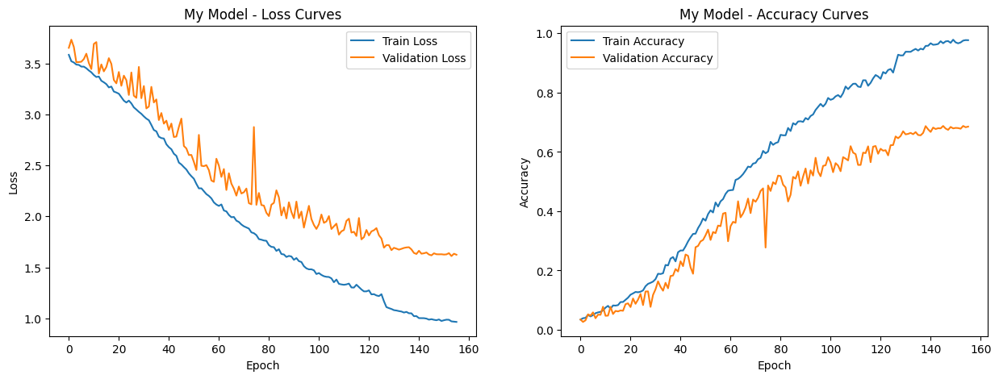

In [ ]:
myModel = MyModel(num_classes=train_dataset.get_num_classes()).to(device)
myModel.load_state_dict(torch.load("./drive/MyDrive/AssignmentsIPCV/best_MyModel.pth"))

test_loss, test_acc = evaluate(myModel, test_loader, criterion, device)
print(f"Accuracy on test set: {test_acc}")

myModel_history = load_history_from_csv(
    "./drive/MyDrive/AssignmentsIPCV/history_MyModel.csv"
)

plot_history(myModel_history, "My Model")


Similarly, the accuracy curves reveal smooth and monotonic improvement over time, with validation accuracy tracking the training curve closely up to the later epochs. This confirms that the model generalizes well to unseen data, thanks to the balance between architectural depth and regularization mechanisms.

However, a few minor drawbacks can be observed. The small but noticeable divergence between training and validation accuracy after around 120 epochs suggests a mild tendency toward overfitting.
Overall, this configuration achieves the best performance among the tested variants, combining stability, depth, and generalization. Despite minor overfitting toward the end of training, the model demonstrates excellent learning dynamics and strong predictive capability.

## Ablation Models
Here, all the ablation models have been instantiated and trained. Since this section is very long, each model has been placed in a separate Markdown group.

### No dropout


In [ ]:
class NoDropout_Model(nn.Module):

    def __init__(self, num_classes: int = 37):
        super().__init__()

        # Feature extraction layers
        self.features = nn.Sequential(
            # First conv block - 32 channels
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Second conv block - 64 channels
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Third conv block - 128 channels
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Fourth conv block - 256 channels
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Fifth conv block - 512 channels
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # Classifier layers
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, num_classes)
        )

        # Initialize weights
        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)


    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


In [ ]:
noDropoutModel = NoDropout_Model(num_classes=train_dataset.get_num_classes()).to(device)

optimizer = optim.Adam(noDropoutModel.parameters(), lr=1e-3, weight_decay=2e-4)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=7, min_lr=1e-7, threshold=1e-4
)

noDropout_history = train_loop(
    noDropoutModel,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    120,
    device,
    "drive/MyDrive/AssignmentsIPCV",
    model_name="NoDropout",
)


--- Epoch 1/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.5512, Train Acc: 0.0501
Val Loss: 3.8639, Val Acc: 0.0496
Learning Rate: 0.001000
New best model saved with accuracy: 0.0496
--- Epoch 2/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4396, Train Acc: 0.0687
Val Loss: 3.8059, Val Acc: 0.0420
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 3/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4015, Train Acc: 0.0834
Val Loss: 3.4865, Val Acc: 0.0611
Learning Rate: 0.001000
New best model saved with accuracy: 0.0611
--- Epoch 4/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3524, Train Acc: 0.0919
Val Loss: 3.5885, Val Acc: 0.0513
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 5/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3036, Train Acc: 0.1033
Val Loss: 3.4078, Val Acc: 0.0851
Learning Rate: 0.001000
New best model saved with accuracy: 0.0851
--- Epoch 6/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2855, Train Acc: 0.1104
Val Loss: 3.4047, Val Acc: 0.0791
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 7/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2553, Train Acc: 0.1183
Val Loss: 3.7560, Val Acc: 0.0562
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 8/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1950, Train Acc: 0.1297
Val Loss: 3.5334, Val Acc: 0.0812
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 9/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1563, Train Acc: 0.1417
Val Loss: 3.4542, Val Acc: 0.0878
Learning Rate: 0.001000
New best model saved with accuracy: 0.0878
--- Epoch 10/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1001, Train Acc: 0.1488
Val Loss: 3.8875, Val Acc: 0.0802
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 11/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0321, Train Acc: 0.1733
Val Loss: 3.9552, Val Acc: 0.0774
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 12/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9791, Train Acc: 0.1845
Val Loss: 3.3630, Val Acc: 0.1216
Learning Rate: 0.001000
New best model saved with accuracy: 0.1216
--- Epoch 13/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8898, Train Acc: 0.2017
Val Loss: 3.3549, Val Acc: 0.1167
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 14/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8086, Train Acc: 0.2249
Val Loss: 3.8646, Val Acc: 0.1020
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 15/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7653, Train Acc: 0.2478
Val Loss: 3.7926, Val Acc: 0.1140
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 16/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6778, Train Acc: 0.2649
Val Loss: 3.5839, Val Acc: 0.1112
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 17/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6208, Train Acc: 0.2810
Val Loss: 3.1685, Val Acc: 0.1510
Learning Rate: 0.001000
New best model saved with accuracy: 0.1510
--- Epoch 18/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5210, Train Acc: 0.3153
Val Loss: 3.9828, Val Acc: 0.1036
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 19/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4934, Train Acc: 0.3211
Val Loss: 3.2141, Val Acc: 0.1674
Learning Rate: 0.001000
New best model saved with accuracy: 0.1674
--- Epoch 20/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4279, Train Acc: 0.3412
Val Loss: 3.0454, Val Acc: 0.1908
Learning Rate: 0.001000
New best model saved with accuracy: 0.1908
--- Epoch 21/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3692, Train Acc: 0.3630
Val Loss: 2.8907, Val Acc: 0.1974
Learning Rate: 0.001000
New best model saved with accuracy: 0.1974
--- Epoch 22/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3169, Train Acc: 0.3824
Val Loss: 3.1741, Val Acc: 0.1838
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 23/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2743, Train Acc: 0.4017
Val Loss: 3.2166, Val Acc: 0.2017
Learning Rate: 0.001000
New best model saved with accuracy: 0.2017
--- Epoch 24/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2014, Train Acc: 0.4287
Val Loss: 2.7067, Val Acc: 0.3010
Learning Rate: 0.001000
New best model saved with accuracy: 0.3010
--- Epoch 25/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1515, Train Acc: 0.4527
Val Loss: 3.4116, Val Acc: 0.1979
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 26/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1111, Train Acc: 0.4655
Val Loss: 2.5867, Val Acc: 0.3119
Learning Rate: 0.001000
New best model saved with accuracy: 0.3119
--- Epoch 27/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.0421, Train Acc: 0.4887
Val Loss: 3.0601, Val Acc: 0.2617
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 28/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.0052, Train Acc: 0.5053
Val Loss: 2.6197, Val Acc: 0.3386
Learning Rate: 0.001000
New best model saved with accuracy: 0.3386
--- Epoch 29/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9535, Train Acc: 0.5312
Val Loss: 3.3022, Val Acc: 0.2388
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 30/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9307, Train Acc: 0.5484
Val Loss: 2.4742, Val Acc: 0.3550
Learning Rate: 0.001000
New best model saved with accuracy: 0.3550
--- Epoch 31/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8721, Train Acc: 0.5587
Val Loss: 2.9995, Val Acc: 0.2666
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 32/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8389, Train Acc: 0.5707
Val Loss: 3.0521, Val Acc: 0.2388
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 33/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7774, Train Acc: 0.5947
Val Loss: 2.5582, Val Acc: 0.3615
Learning Rate: 0.001000
New best model saved with accuracy: 0.3615
--- Epoch 34/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7401, Train Acc: 0.6081
Val Loss: 2.4713, Val Acc: 0.3621
Learning Rate: 0.001000
New best model saved with accuracy: 0.3621
--- Epoch 35/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7289, Train Acc: 0.6201
Val Loss: 2.9223, Val Acc: 0.2803
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 36/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6378, Train Acc: 0.6588
Val Loss: 2.6898, Val Acc: 0.3473
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 37/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6560, Train Acc: 0.6525
Val Loss: 3.1090, Val Acc: 0.2399
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 38/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5789, Train Acc: 0.6866
Val Loss: 2.5736, Val Acc: 0.3582
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 39/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5362, Train Acc: 0.7007
Val Loss: 2.3299, Val Acc: 0.4166
Learning Rate: 0.001000
New best model saved with accuracy: 0.4166
--- Epoch 40/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5282, Train Acc: 0.7026
Val Loss: 2.4940, Val Acc: 0.4051
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 41/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5035, Train Acc: 0.7144
Val Loss: 2.2572, Val Acc: 0.4667
Learning Rate: 0.001000
New best model saved with accuracy: 0.4667
--- Epoch 42/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4727, Train Acc: 0.7244
Val Loss: 2.6941, Val Acc: 0.3364
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 43/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4706, Train Acc: 0.7176
Val Loss: 3.1361, Val Acc: 0.2972
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 44/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4062, Train Acc: 0.7563
Val Loss: 2.1095, Val Acc: 0.4858
Learning Rate: 0.001000
New best model saved with accuracy: 0.4858
--- Epoch 45/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3773, Train Acc: 0.7724
Val Loss: 3.1495, Val Acc: 0.3490
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 46/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3648, Train Acc: 0.7702
Val Loss: 2.4036, Val Acc: 0.4220
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 47/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3519, Train Acc: 0.7790
Val Loss: 2.5017, Val Acc: 0.3986
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 48/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3090, Train Acc: 0.7959
Val Loss: 1.9759, Val Acc: 0.5463
Learning Rate: 0.001000
New best model saved with accuracy: 0.5463
--- Epoch 49/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2956, Train Acc: 0.7956
Val Loss: 2.1079, Val Acc: 0.4989
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 50/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2754, Train Acc: 0.8029
Val Loss: 2.2240, Val Acc: 0.4820
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 51/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2495, Train Acc: 0.8190
Val Loss: 1.9555, Val Acc: 0.5562
Learning Rate: 0.001000
New best model saved with accuracy: 0.5562
--- Epoch 52/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2538, Train Acc: 0.8207
Val Loss: 2.4713, Val Acc: 0.4089
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 53/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2260, Train Acc: 0.8250
Val Loss: 2.1136, Val Acc: 0.5174
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 54/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1887, Train Acc: 0.8422
Val Loss: 2.0899, Val Acc: 0.5136
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 55/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1717, Train Acc: 0.8531
Val Loss: 2.2372, Val Acc: 0.4836
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 56/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1489, Train Acc: 0.8621
Val Loss: 2.4224, Val Acc: 0.4188
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 57/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1027, Train Acc: 0.8776
Val Loss: 1.9450, Val Acc: 0.5632
Learning Rate: 0.001000
New best model saved with accuracy: 0.5632
--- Epoch 58/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1169, Train Acc: 0.8735
Val Loss: 2.4964, Val Acc: 0.4128
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 59/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1244, Train Acc: 0.8733
Val Loss: 2.2337, Val Acc: 0.4749
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 60/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0830, Train Acc: 0.8948
Val Loss: 1.9641, Val Acc: 0.5616
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 61/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0728, Train Acc: 0.8940
Val Loss: 2.4372, Val Acc: 0.4171
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 62/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0427, Train Acc: 0.9065
Val Loss: 2.1311, Val Acc: 0.5311
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 63/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0264, Train Acc: 0.9109
Val Loss: 2.0485, Val Acc: 0.5267
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 64/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9974, Train Acc: 0.9280
Val Loss: 1.9627, Val Acc: 0.5436
Learning Rate: 0.001000
No improvement for 7 epoch(s)
--- Epoch 65/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0020, Train Acc: 0.9242
Val Loss: 2.2826, Val Acc: 0.5005
Learning Rate: 0.001000
>>> Learning rate reduced from 0.001000 to 0.000500
No improvement for 8 epoch(s)
--- Epoch 66/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9385, Train Acc: 0.9542
Val Loss: 1.7175, Val Acc: 0.6483
Learning Rate: 0.000500
New best model saved with accuracy: 0.6483
--- Epoch 67/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8879, Train Acc: 0.9670
Val Loss: 1.7914, Val Acc: 0.6227
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 68/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8568, Train Acc: 0.9804
Val Loss: 1.7428, Val Acc: 0.6341
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 69/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8506, Train Acc: 0.9790
Val Loss: 1.7221, Val Acc: 0.6287
Learning Rate: 0.000500
No improvement for 3 epoch(s)
--- Epoch 70/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8459, Train Acc: 0.9804
Val Loss: 1.7396, Val Acc: 0.6363
Learning Rate: 0.000500
No improvement for 4 epoch(s)
--- Epoch 71/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8437, Train Acc: 0.9828
Val Loss: 1.9163, Val Acc: 0.5845
Learning Rate: 0.000500
No improvement for 5 epoch(s)
--- Epoch 72/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8386, Train Acc: 0.9820
Val Loss: 1.8764, Val Acc: 0.6003
Learning Rate: 0.000500
No improvement for 6 epoch(s)
--- Epoch 73/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8428, Train Acc: 0.9796
Val Loss: 1.7976, Val Acc: 0.6292
Learning Rate: 0.000500
No improvement for 7 epoch(s)
--- Epoch 74/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8305, Train Acc: 0.9866
Val Loss: 1.8196, Val Acc: 0.6216
Learning Rate: 0.000500
>>> Learning rate reduced from 0.000500 to 0.000250
No improvement for 8 epoch(s)
--- Epoch 75/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8102, Train Acc: 0.9902
Val Loss: 1.6813, Val Acc: 0.6701
Learning Rate: 0.000250
New best model saved with accuracy: 0.6701
--- Epoch 76/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7902, Train Acc: 0.9959
Val Loss: 1.6869, Val Acc: 0.6538
Learning Rate: 0.000250
No improvement for 1 epoch(s)
--- Epoch 77/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7911, Train Acc: 0.9954
Val Loss: 1.6869, Val Acc: 0.6521
Learning Rate: 0.000250
No improvement for 2 epoch(s)
--- Epoch 78/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7796, Train Acc: 0.9965
Val Loss: 1.6503, Val Acc: 0.6636
Learning Rate: 0.000250
No improvement for 3 epoch(s)
--- Epoch 79/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7788, Train Acc: 0.9967
Val Loss: 1.7516, Val Acc: 0.6314
Learning Rate: 0.000250
No improvement for 4 epoch(s)
--- Epoch 80/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7742, Train Acc: 0.9973
Val Loss: 1.7065, Val Acc: 0.6390
Learning Rate: 0.000250
No improvement for 5 epoch(s)
--- Epoch 81/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7744, Train Acc: 0.9967
Val Loss: 1.6863, Val Acc: 0.6576
Learning Rate: 0.000250
No improvement for 6 epoch(s)
--- Epoch 82/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7754, Train Acc: 0.9978
Val Loss: 1.6880, Val Acc: 0.6565
Learning Rate: 0.000250
No improvement for 7 epoch(s)
--- Epoch 83/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7694, Train Acc: 0.9986
Val Loss: 1.7039, Val Acc: 0.6630
Learning Rate: 0.000250
No improvement for 8 epoch(s)
--- Epoch 84/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7699, Train Acc: 0.9962
Val Loss: 1.7045, Val Acc: 0.6619
Learning Rate: 0.000250
No improvement for 9 epoch(s)
--- Epoch 85/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7732, Train Acc: 0.9970
Val Loss: 1.6846, Val Acc: 0.6598
Learning Rate: 0.000250
No improvement for 10 epoch(s)

Early stopping triggered after 85 epochs (no improvement for 10 epochs)
Training finished.

Training history saved to: drive/MyDrive/AssignmentsIPCV/history_NoDropout.csv
Best validation accuracy: 0.6701


Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Accuracy on test set: 0.6971830985915493


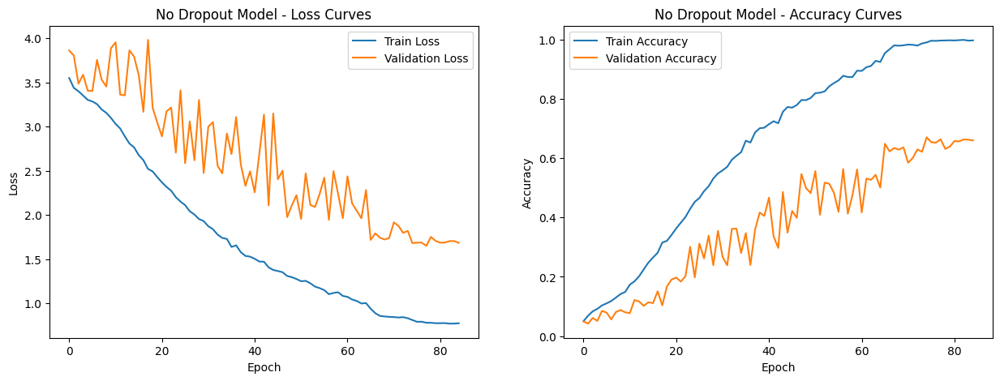

In [ ]:
noDropoutModel = NoDropout_Model(num_classes=train_dataset.get_num_classes()).to(device)
noDropoutModel.load_state_dict(
    torch.load("./drive/MyDrive/AssignmentsIPCV/best_NoDropout.pth")
)

test_loss, test_acc = evaluate(noDropoutModel, test_loader, criterion, device)
print(f"Accuracy on test set: {test_acc}")

noDropout_history = load_history_from_csv(
    "./drive/MyDrive/AssignmentsIPCV/history_NoDropout.csv"
)

plot_history(noDropout_history, "No Dropout Model")


This model is severely overfitting the training data. Without dropout, the neural network becomes too reliant on specific neuron activations and memorizes the training examples rather than learning general patterns.

The chaotic oscillations in the validation curves reveal that the model may be highly unstable with unseen data.

Dropout prevents this by randomly deactivating neurons during training, which forces the network to learn redundant, distributed representations. This regularization creates smoother decision boundaries that generalize better.

### No batch normalization

In [ ]:
class NoBatchNorm_Model(nn.Module):

    def __init__(self, num_classes: int = 37):
        super().__init__()

        # Feature extraction layers
        self.features = nn.Sequential(
            # First conv block - 32 channels
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Second conv block - 64 channels
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Third conv block - 128 channels
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Dropout2d(0.3),

            # Fourth conv block - 256 channels
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Fifth conv block - 512 channels
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # Classifier layers
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes)
        )

        # Initialize weights
        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)


    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


In [ ]:
noBatchNormModel = NoBatchNorm_Model(num_classes=train_dataset.get_num_classes()).to(
    device
)

optimizer = optim.Adam(noBatchNormModel.parameters(), lr=1e-3, weight_decay=2e-4)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=7, min_lr=1e-7, threshold=1e-4
)

noBatchNormModel_history = train_loop(
    noBatchNormModel,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    120,
    device,
    "drive/MyDrive/AssignmentsIPCV",
    model_name="NoBatchNorm",
)


--- Epoch 1/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6117, Train Acc: 0.0243
Val Loss: 3.6109, Val Acc: 0.0251
Learning Rate: 0.001000
New best model saved with accuracy: 0.0251
--- Epoch 2/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6111, Train Acc: 0.0194
Val Loss: 3.6109, Val Acc: 0.0273
Learning Rate: 0.001000
New best model saved with accuracy: 0.0273
--- Epoch 3/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6110, Train Acc: 0.0259
Val Loss: 3.6109, Val Acc: 0.0273
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 4/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6110, Train Acc: 0.0221
Val Loss: 3.6109, Val Acc: 0.0251
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 5/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6110, Train Acc: 0.0232
Val Loss: 3.6109, Val Acc: 0.0251
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 6/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6110, Train Acc: 0.0207
Val Loss: 3.6109, Val Acc: 0.0273
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 7/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6110, Train Acc: 0.0213
Val Loss: 3.6109, Val Acc: 0.0273
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 8/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6109, Train Acc: 0.0218
Val Loss: 3.6109, Val Acc: 0.0273
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 9/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6109, Train Acc: 0.0253
Val Loss: 3.6109, Val Acc: 0.0251
Learning Rate: 0.001000
>>> Learning rate reduced from 0.001000 to 0.000500
No improvement for 7 epoch(s)
--- Epoch 10/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6108, Train Acc: 0.0273
Val Loss: 3.6109, Val Acc: 0.0251
Learning Rate: 0.000500
No improvement for 8 epoch(s)
--- Epoch 11/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6108, Train Acc: 0.0215
Val Loss: 3.6109, Val Acc: 0.0251
Learning Rate: 0.000500
No improvement for 9 epoch(s)
--- Epoch 12/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.6108, Train Acc: 0.0226
Val Loss: 3.6109, Val Acc: 0.0273
Learning Rate: 0.000500
No improvement for 10 epoch(s)

Early stopping triggered after 12 epochs (no improvement for 10 epochs)
Training finished.

Training history saved to: drive/MyDrive/AssignmentsIPCV/history_NoBatchNorm.csv
Best validation accuracy: 0.0273


Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Accuracy on test set: 0.027085590465872156


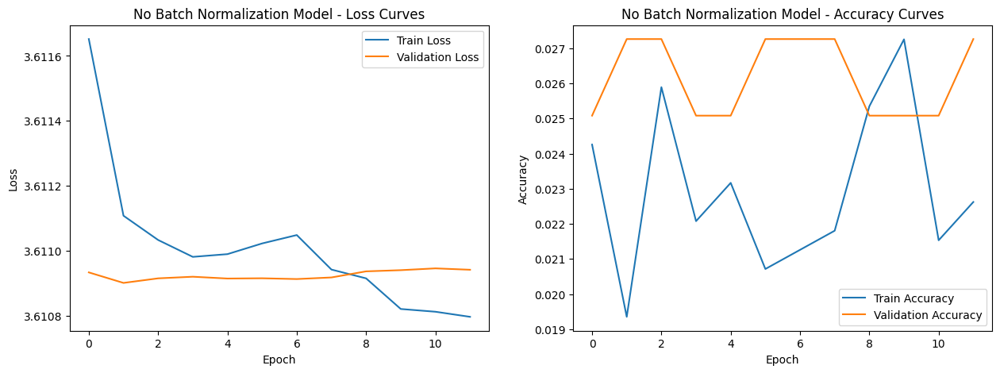

In [ ]:
noBatchNormModel = NoBatchNorm_Model(num_classes=train_dataset.get_num_classes()).to(
    device
)
noBatchNormModel.load_state_dict(
    torch.load("./drive/MyDrive/AssignmentsIPCV/best_NoBatchNorm.pth")
)

test_loss, test_acc = evaluate(noBatchNormModel, test_loader, criterion, device)
print(f"Accuracy on test set: {test_acc}")

noBatchNorm_history = load_history_from_csv(
    "./drive/MyDrive/AssignmentsIPCV/history_NoBatchNorm.csv"
)

plot_history(noBatchNorm_history, "No Batch Normalization Model")


Removing Batch Normalization has caused a catastrophic failure in the training process. The model is failing to learn.

The final test accuracy of ~2.7% is consistent with random guessing, indicating no meaningful patterns were learned. The accuracy curves show chaotic oscillations within a very low range with no upward trend, confirming the model's instability.

This result proves that Batch Normalization was absolutely essential for model's convergence. Without it, the network likely suffered from severe internal covariate shift and unstable gradients.

### Smaller

In [ ]:
class Smaller_Model(nn.Module):

    def __init__(self, num_classes: int = 37):
        super().__init__()

        # Feature extraction layers
        self.features = nn.Sequential(
            # First conv block - 32 channels
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Second conv block - 64 channels
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Third conv block - 128 channels
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Dropout2d(0.3),

            # Fourth conv block - 256 channels
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # Classifier layers
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(256, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes)
        )

        # Initialize weights
        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)


    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


In [ ]:
smallerModel = Smaller_Model(num_classes=train_dataset.get_num_classes()).to(device)

optimizer = optim.Adam(smallerModel.parameters(), lr=1e-3, weight_decay=2e-4)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=7, min_lr=1e-7, threshold=1e-4
)

smaller_history = train_loop(
    smallerModel,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    120,
    device,
    "drive/MyDrive/AssignmentsIPCV",
    model_name="Smaller",
)


--- Epoch 1/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.5966, Train Acc: 0.0349
Val Loss: 3.5655, Val Acc: 0.0491
Learning Rate: 0.001000
New best model saved with accuracy: 0.0491
--- Epoch 2/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.5271, Train Acc: 0.0529
Val Loss: 3.5342, Val Acc: 0.0523
Learning Rate: 0.001000
New best model saved with accuracy: 0.0523
--- Epoch 3/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4734, Train Acc: 0.0654
Val Loss: 3.5020, Val Acc: 0.0649
Learning Rate: 0.001000
New best model saved with accuracy: 0.0649
--- Epoch 4/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4525, Train Acc: 0.0736
Val Loss: 3.5331, Val Acc: 0.0605
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 5/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4318, Train Acc: 0.0774
Val Loss: 3.5188, Val Acc: 0.0534
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 6/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3996, Train Acc: 0.0869
Val Loss: 3.5543, Val Acc: 0.0529
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 7/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3933, Train Acc: 0.0831
Val Loss: 3.4669, Val Acc: 0.0682
Learning Rate: 0.001000
New best model saved with accuracy: 0.0682
--- Epoch 8/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3767, Train Acc: 0.0880
Val Loss: 3.4447, Val Acc: 0.0725
Learning Rate: 0.001000
New best model saved with accuracy: 0.0725
--- Epoch 9/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3475, Train Acc: 0.0913
Val Loss: 3.4221, Val Acc: 0.0867
Learning Rate: 0.001000
New best model saved with accuracy: 0.0867
--- Epoch 10/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3432, Train Acc: 0.1006
Val Loss: 3.4536, Val Acc: 0.0807
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 11/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3242, Train Acc: 0.1036
Val Loss: 3.4294, Val Acc: 0.0883
Learning Rate: 0.001000
New best model saved with accuracy: 0.0883
--- Epoch 12/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3040, Train Acc: 0.1082
Val Loss: 3.3628, Val Acc: 0.0992
Learning Rate: 0.001000
New best model saved with accuracy: 0.0992
--- Epoch 13/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3036, Train Acc: 0.1096
Val Loss: 3.3915, Val Acc: 0.0954
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 14/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2846, Train Acc: 0.1175
Val Loss: 3.4745, Val Acc: 0.0600
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 15/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2538, Train Acc: 0.1175
Val Loss: 3.3272, Val Acc: 0.1107
Learning Rate: 0.001000
New best model saved with accuracy: 0.1107
--- Epoch 16/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2288, Train Acc: 0.1308
Val Loss: 3.3112, Val Acc: 0.1172
Learning Rate: 0.001000
New best model saved with accuracy: 0.1172
--- Epoch 17/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2250, Train Acc: 0.1243
Val Loss: 3.4743, Val Acc: 0.0791
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 18/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2122, Train Acc: 0.1295
Val Loss: 3.4412, Val Acc: 0.0840
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 19/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1721, Train Acc: 0.1352
Val Loss: 3.2686, Val Acc: 0.1221
Learning Rate: 0.001000
New best model saved with accuracy: 0.1221
--- Epoch 20/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1608, Train Acc: 0.1428
Val Loss: 3.2868, Val Acc: 0.1270
Learning Rate: 0.001000
New best model saved with accuracy: 0.1270
--- Epoch 21/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1422, Train Acc: 0.1545
Val Loss: 3.2677, Val Acc: 0.1194
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 22/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1172, Train Acc: 0.1605
Val Loss: 3.2571, Val Acc: 0.1172
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 23/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1013, Train Acc: 0.1594
Val Loss: 3.3480, Val Acc: 0.1074
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 24/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1193, Train Acc: 0.1627
Val Loss: 3.2344, Val Acc: 0.1320
Learning Rate: 0.001000
New best model saved with accuracy: 0.1320
--- Epoch 25/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0799, Train Acc: 0.1652
Val Loss: 3.2415, Val Acc: 0.1309
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 26/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0683, Train Acc: 0.1733
Val Loss: 3.1865, Val Acc: 0.1456
Learning Rate: 0.001000
New best model saved with accuracy: 0.1456
--- Epoch 27/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0492, Train Acc: 0.1837
Val Loss: 3.1893, Val Acc: 0.1418
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 28/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0147, Train Acc: 0.1902
Val Loss: 3.2979, Val Acc: 0.1210
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 29/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0027, Train Acc: 0.2003
Val Loss: 3.1204, Val Acc: 0.1761
Learning Rate: 0.001000
New best model saved with accuracy: 0.1761
--- Epoch 30/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9717, Train Acc: 0.2025
Val Loss: 3.1452, Val Acc: 0.1570
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 31/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9739, Train Acc: 0.2028
Val Loss: 3.2020, Val Acc: 0.1445
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 32/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9582, Train Acc: 0.2074
Val Loss: 3.0419, Val Acc: 0.1854
Learning Rate: 0.001000
New best model saved with accuracy: 0.1854
--- Epoch 33/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9458, Train Acc: 0.2085
Val Loss: 3.0192, Val Acc: 0.2034
Learning Rate: 0.001000
New best model saved with accuracy: 0.2034
--- Epoch 34/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9079, Train Acc: 0.2186
Val Loss: 3.0646, Val Acc: 0.1870
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 35/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9177, Train Acc: 0.2159
Val Loss: 3.0167, Val Acc: 0.1963
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 36/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8873, Train Acc: 0.2325
Val Loss: 3.1545, Val Acc: 0.1641
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 37/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8925, Train Acc: 0.2265
Val Loss: 3.1802, Val Acc: 0.1456
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 38/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8878, Train Acc: 0.2235
Val Loss: 3.1043, Val Acc: 0.1712
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 39/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8753, Train Acc: 0.2363
Val Loss: 3.0452, Val Acc: 0.2034
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 40/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8531, Train Acc: 0.2448
Val Loss: 3.0567, Val Acc: 0.1832
Learning Rate: 0.001000
No improvement for 7 epoch(s)
--- Epoch 41/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8536, Train Acc: 0.2396
Val Loss: 3.0042, Val Acc: 0.1947
Learning Rate: 0.001000
No improvement for 8 epoch(s)
--- Epoch 42/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8262, Train Acc: 0.2488
Val Loss: 2.9670, Val Acc: 0.2203
Learning Rate: 0.001000
New best model saved with accuracy: 0.2203
--- Epoch 43/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8399, Train Acc: 0.2431
Val Loss: 3.1724, Val Acc: 0.1778
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 44/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8045, Train Acc: 0.2576
Val Loss: 3.0121, Val Acc: 0.2028
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 45/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8121, Train Acc: 0.2608
Val Loss: 3.0240, Val Acc: 0.1952
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 46/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7843, Train Acc: 0.2622
Val Loss: 3.0196, Val Acc: 0.1832
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 47/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7780, Train Acc: 0.2663
Val Loss: 3.0116, Val Acc: 0.2023
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 48/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7657, Train Acc: 0.2660
Val Loss: 3.0442, Val Acc: 0.1925
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 49/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7795, Train Acc: 0.2706
Val Loss: 3.1375, Val Acc: 0.1761
Learning Rate: 0.001000
No improvement for 7 epoch(s)
--- Epoch 50/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7676, Train Acc: 0.2712
Val Loss: 2.9059, Val Acc: 0.2372
Learning Rate: 0.001000
New best model saved with accuracy: 0.2372
--- Epoch 51/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7497, Train Acc: 0.2731
Val Loss: 3.1503, Val Acc: 0.1832
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 52/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7487, Train Acc: 0.2824
Val Loss: 2.8902, Val Acc: 0.2268
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 53/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7196, Train Acc: 0.2750
Val Loss: 2.8251, Val Acc: 0.2497
Learning Rate: 0.001000
New best model saved with accuracy: 0.2497
--- Epoch 54/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6993, Train Acc: 0.2807
Val Loss: 2.8502, Val Acc: 0.2563
Learning Rate: 0.001000
New best model saved with accuracy: 0.2563
--- Epoch 55/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7131, Train Acc: 0.2824
Val Loss: 2.8539, Val Acc: 0.2486
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 56/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7037, Train Acc: 0.2818
Val Loss: 2.8473, Val Acc: 0.2459
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 57/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6833, Train Acc: 0.2835
Val Loss: 2.8664, Val Acc: 0.2546
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 58/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6961, Train Acc: 0.2916
Val Loss: 2.8488, Val Acc: 0.2574
Learning Rate: 0.001000
New best model saved with accuracy: 0.2574
--- Epoch 59/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6590, Train Acc: 0.3020
Val Loss: 3.1024, Val Acc: 0.1827
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 60/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6737, Train Acc: 0.2933
Val Loss: 2.8355, Val Acc: 0.2481
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 61/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6651, Train Acc: 0.3047
Val Loss: 2.8316, Val Acc: 0.2606
Learning Rate: 0.001000
>>> Learning rate reduced from 0.001000 to 0.000500
New best model saved with accuracy: 0.2606
--- Epoch 62/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6000, Train Acc: 0.3186
Val Loss: 2.7548, Val Acc: 0.2792
Learning Rate: 0.000500
New best model saved with accuracy: 0.2792
--- Epoch 63/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5828, Train Acc: 0.3246
Val Loss: 2.7289, Val Acc: 0.3070
Learning Rate: 0.000500
New best model saved with accuracy: 0.3070
--- Epoch 64/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5648, Train Acc: 0.3331
Val Loss: 2.6963, Val Acc: 0.3152
Learning Rate: 0.000500
New best model saved with accuracy: 0.3152
--- Epoch 65/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5617, Train Acc: 0.3377
Val Loss: 2.7333, Val Acc: 0.2819
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 66/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5418, Train Acc: 0.3366
Val Loss: 2.8148, Val Acc: 0.2699
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 67/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5581, Train Acc: 0.3331
Val Loss: 2.6864, Val Acc: 0.3288
Learning Rate: 0.000500
New best model saved with accuracy: 0.3288
--- Epoch 68/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5305, Train Acc: 0.3393
Val Loss: 2.7213, Val Acc: 0.2944
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 69/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5398, Train Acc: 0.3429
Val Loss: 2.7240, Val Acc: 0.3043
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 70/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5278, Train Acc: 0.3459
Val Loss: 2.8442, Val Acc: 0.2465
Learning Rate: 0.000500
No improvement for 3 epoch(s)
--- Epoch 71/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5124, Train Acc: 0.3470
Val Loss: 2.6838, Val Acc: 0.3070
Learning Rate: 0.000500
No improvement for 4 epoch(s)
--- Epoch 72/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5240, Train Acc: 0.3521
Val Loss: 2.6326, Val Acc: 0.3386
Learning Rate: 0.000500
New best model saved with accuracy: 0.3386
--- Epoch 73/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4952, Train Acc: 0.3540
Val Loss: 2.6283, Val Acc: 0.3304
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 74/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5032, Train Acc: 0.3546
Val Loss: 2.6455, Val Acc: 0.3261
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 75/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5200, Train Acc: 0.3568
Val Loss: 2.6922, Val Acc: 0.2993
Learning Rate: 0.000500
No improvement for 3 epoch(s)
--- Epoch 76/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5080, Train Acc: 0.3508
Val Loss: 2.6950, Val Acc: 0.2874
Learning Rate: 0.000500
No improvement for 4 epoch(s)
--- Epoch 77/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5031, Train Acc: 0.3481
Val Loss: 2.6779, Val Acc: 0.3299
Learning Rate: 0.000500
No improvement for 5 epoch(s)
--- Epoch 78/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4893, Train Acc: 0.3633
Val Loss: 2.6674, Val Acc: 0.3222
Learning Rate: 0.000500
No improvement for 6 epoch(s)
--- Epoch 79/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4665, Train Acc: 0.3636
Val Loss: 2.6271, Val Acc: 0.3277
Learning Rate: 0.000500
No improvement for 7 epoch(s)
--- Epoch 80/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4803, Train Acc: 0.3649
Val Loss: 2.6143, Val Acc: 0.3381
Learning Rate: 0.000500
No improvement for 8 epoch(s)
--- Epoch 81/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4670, Train Acc: 0.3606
Val Loss: 2.5944, Val Acc: 0.3473
Learning Rate: 0.000500
New best model saved with accuracy: 0.3473
--- Epoch 82/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4623, Train Acc: 0.3581
Val Loss: 2.6970, Val Acc: 0.3037
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 83/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4585, Train Acc: 0.3838
Val Loss: 2.6711, Val Acc: 0.3217
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 84/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4460, Train Acc: 0.3851
Val Loss: 2.6299, Val Acc: 0.3413
Learning Rate: 0.000500
No improvement for 3 epoch(s)
--- Epoch 85/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4420, Train Acc: 0.3827
Val Loss: 2.6051, Val Acc: 0.3419
Learning Rate: 0.000500
No improvement for 4 epoch(s)
--- Epoch 86/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4275, Train Acc: 0.3767
Val Loss: 2.5701, Val Acc: 0.3484
Learning Rate: 0.000500
New best model saved with accuracy: 0.3484
--- Epoch 87/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4216, Train Acc: 0.3709
Val Loss: 2.5687, Val Acc: 0.3479
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 88/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4197, Train Acc: 0.3808
Val Loss: 2.6282, Val Acc: 0.3206
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 89/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4237, Train Acc: 0.3756
Val Loss: 2.6256, Val Acc: 0.3299
Learning Rate: 0.000500
No improvement for 3 epoch(s)
--- Epoch 90/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4236, Train Acc: 0.3846
Val Loss: 2.5887, Val Acc: 0.3326
Learning Rate: 0.000500
No improvement for 4 epoch(s)
--- Epoch 91/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4075, Train Acc: 0.3818
Val Loss: 2.7025, Val Acc: 0.2999
Learning Rate: 0.000500
No improvement for 5 epoch(s)
--- Epoch 92/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4046, Train Acc: 0.3810
Val Loss: 2.5853, Val Acc: 0.3391
Learning Rate: 0.000500
No improvement for 6 epoch(s)
--- Epoch 93/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3972, Train Acc: 0.3911
Val Loss: 2.6212, Val Acc: 0.3293
Learning Rate: 0.000500
No improvement for 7 epoch(s)
--- Epoch 94/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3888, Train Acc: 0.3944
Val Loss: 2.6073, Val Acc: 0.3391
Learning Rate: 0.000500
No improvement for 8 epoch(s)
--- Epoch 95/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3733, Train Acc: 0.4007
Val Loss: 2.5931, Val Acc: 0.3353
Learning Rate: 0.000500
>>> Learning rate reduced from 0.000500 to 0.000250
No improvement for 9 epoch(s)
--- Epoch 96/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3444, Train Acc: 0.4067
Val Loss: 2.5208, Val Acc: 0.3566
Learning Rate: 0.000250
New best model saved with accuracy: 0.3566
--- Epoch 97/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3386, Train Acc: 0.4137
Val Loss: 2.4775, Val Acc: 0.3800
Learning Rate: 0.000250
New best model saved with accuracy: 0.3800
--- Epoch 98/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3324, Train Acc: 0.4113
Val Loss: 2.4671, Val Acc: 0.3828
Learning Rate: 0.000250
New best model saved with accuracy: 0.3828
--- Epoch 99/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3032, Train Acc: 0.4129
Val Loss: 2.5052, Val Acc: 0.3735
Learning Rate: 0.000250
No improvement for 1 epoch(s)
--- Epoch 100/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3295, Train Acc: 0.4083
Val Loss: 2.4958, Val Acc: 0.3779
Learning Rate: 0.000250
No improvement for 2 epoch(s)
--- Epoch 101/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2977, Train Acc: 0.4235
Val Loss: 2.4737, Val Acc: 0.3817
Learning Rate: 0.000250
No improvement for 3 epoch(s)
--- Epoch 102/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3060, Train Acc: 0.4246
Val Loss: 2.5422, Val Acc: 0.3648
Learning Rate: 0.000250
No improvement for 4 epoch(s)
--- Epoch 103/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3142, Train Acc: 0.4146
Val Loss: 2.4874, Val Acc: 0.3686
Learning Rate: 0.000250
No improvement for 5 epoch(s)
--- Epoch 104/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2918, Train Acc: 0.4279
Val Loss: 2.4972, Val Acc: 0.3779
Learning Rate: 0.000250
No improvement for 6 epoch(s)
--- Epoch 105/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2796, Train Acc: 0.4342
Val Loss: 2.4495, Val Acc: 0.3888
Learning Rate: 0.000250
New best model saved with accuracy: 0.3888
--- Epoch 106/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2991, Train Acc: 0.4186
Val Loss: 2.4574, Val Acc: 0.3719
Learning Rate: 0.000250
No improvement for 1 epoch(s)
--- Epoch 107/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3030, Train Acc: 0.4159
Val Loss: 2.4417, Val Acc: 0.3986
Learning Rate: 0.000250
New best model saved with accuracy: 0.3986
--- Epoch 108/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2721, Train Acc: 0.4391
Val Loss: 2.4413, Val Acc: 0.3866
Learning Rate: 0.000250
No improvement for 1 epoch(s)
--- Epoch 109/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2831, Train Acc: 0.4301
Val Loss: 2.4392, Val Acc: 0.3806
Learning Rate: 0.000250
No improvement for 2 epoch(s)
--- Epoch 110/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2764, Train Acc: 0.4282
Val Loss: 2.4214, Val Acc: 0.3888
Learning Rate: 0.000250
No improvement for 3 epoch(s)
--- Epoch 111/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2651, Train Acc: 0.4426
Val Loss: 2.4473, Val Acc: 0.3931
Learning Rate: 0.000250
No improvement for 4 epoch(s)
--- Epoch 112/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2777, Train Acc: 0.4298
Val Loss: 2.4656, Val Acc: 0.3822
Learning Rate: 0.000250
No improvement for 5 epoch(s)
--- Epoch 113/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2708, Train Acc: 0.4377
Val Loss: 2.4835, Val Acc: 0.3784
Learning Rate: 0.000250
No improvement for 6 epoch(s)
--- Epoch 114/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2739, Train Acc: 0.4355
Val Loss: 2.4465, Val Acc: 0.3866
Learning Rate: 0.000250
No improvement for 7 epoch(s)
--- Epoch 115/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2773, Train Acc: 0.4317
Val Loss: 2.4279, Val Acc: 0.3828
Learning Rate: 0.000250
No improvement for 8 epoch(s)
--- Epoch 116/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2596, Train Acc: 0.4342
Val Loss: 2.4234, Val Acc: 0.3779
Learning Rate: 0.000250
No improvement for 9 epoch(s)
--- Epoch 117/120 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2454, Train Acc: 0.4353
Val Loss: 2.4260, Val Acc: 0.3877
Learning Rate: 0.000250
No improvement for 10 epoch(s)

Early stopping triggered after 117 epochs (no improvement for 10 epochs)
Training finished.

Training history saved to: drive/MyDrive/AssignmentsIPCV/history_Smaller.csv
Best validation accuracy: 0.3986


Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Accuracy on test set: 0.4355362946912243


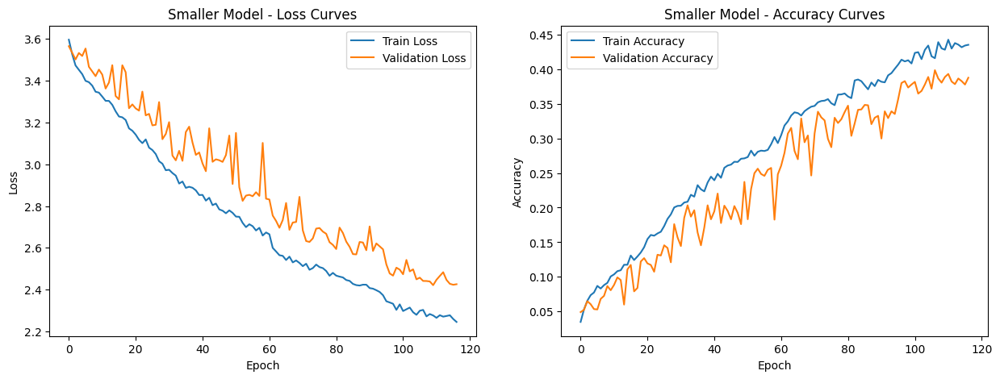

In [ ]:
smallerModel = Smaller_Model(num_classes=train_dataset.get_num_classes()).to(device)
smallerModel.load_state_dict(
    torch.load("./drive/MyDrive/AssignmentsIPCV/best_Smaller.pth")
)

test_loss, test_acc = evaluate(smallerModel, test_loader, criterion, device)
print(f"Accuracy on test set: {test_acc}")

smallerModel_history = load_history_from_csv(
    "./drive/MyDrive/AssignmentsIPCV/history_Smaller.csv"
)

plot_history(smallerModel_history, "Smaller Model")


Removing the fifth convolutional block led to a noticeable drop in model capacity and representational power. While the model still learns, as shown by the consistent downward trend in both training and validation losses, it struggles to achieve high accuracy.

The loss curves suggest stable optimization and no signs of severe overfitting.
Essentially, removing the final convolutional block reduces the network’s ability to capture extract high-level semantic features from the data.

This result highlights that this block plays a crucial role in   model performance. Its removal makes the model simpler and more stable but significantly less expressive, leading to underfitting.

### Simple classifier with no hidden layers

In [ ]:
class SimpleClassifier_Model(nn.Module):

    def __init__(self, num_classes: int = 37):
        super().__init__()

        # Feature extraction layers
        self.features = nn.Sequential(
            # First conv block - 32 channels
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Second conv block - 64 channels
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Third conv block - 128 channels
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Dropout2d(0.3),

            # Fourth conv block - 256 channels
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Fifth conv block - 512 channels
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # Classifier layers
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(512, num_classes)
        )

        # Initialize weights
        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)


    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


In [ ]:
simpleClassifierModel = SimpleClassifier_Model(
    num_classes=train_dataset.get_num_classes()
).to(device)

optimizer = optim.Adam(simpleClassifierModel.parameters(), lr=1e-3, weight_decay=2e-4)
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=7, min_lr=1e-7, threshold=1e-4
)

simpleClassifier_history = train_loop(
    simpleClassifierModel,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    150,
    device,
    "drive/MyDrive/AssignmentsIPCV",
    model_name="SimpleClassifier",
)


--- Epoch 1/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.5750, Train Acc: 0.0485
Val Loss: 3.6090, Val Acc: 0.0442
Learning Rate: 0.001000
New best model saved with accuracy: 0.0442
--- Epoch 2/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.4620, Train Acc: 0.0651
Val Loss: 3.5026, Val Acc: 0.0611
Learning Rate: 0.001000
New best model saved with accuracy: 0.0611
--- Epoch 3/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3765, Train Acc: 0.0984
Val Loss: 4.1101, Val Acc: 0.0469
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 4/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.3040, Train Acc: 0.1115
Val Loss: 3.4600, Val Acc: 0.0769
Learning Rate: 0.001000
New best model saved with accuracy: 0.0769
--- Epoch 5/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.2358, Train Acc: 0.1379
Val Loss: 3.3344, Val Acc: 0.1205
Learning Rate: 0.001000
New best model saved with accuracy: 0.1205
--- Epoch 6/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.1489, Train Acc: 0.1548
Val Loss: 3.3548, Val Acc: 0.1145
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 7/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0845, Train Acc: 0.1742
Val Loss: 5.0933, Val Acc: 0.0742
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 8/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 3.0166, Train Acc: 0.1924
Val Loss: 3.4916, Val Acc: 0.1080
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 9/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.9610, Train Acc: 0.2142
Val Loss: 4.0972, Val Acc: 0.0971
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 10/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8730, Train Acc: 0.2317
Val Loss: 3.1432, Val Acc: 0.1576
Learning Rate: 0.001000
New best model saved with accuracy: 0.1576
--- Epoch 11/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.8070, Train Acc: 0.2486
Val Loss: 3.0192, Val Acc: 0.1903
Learning Rate: 0.001000
New best model saved with accuracy: 0.1903
--- Epoch 12/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.7258, Train Acc: 0.2717
Val Loss: 3.0188, Val Acc: 0.2083
Learning Rate: 0.001000
New best model saved with accuracy: 0.2083
--- Epoch 13/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6842, Train Acc: 0.2756
Val Loss: 3.0336, Val Acc: 0.2028
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 14/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.6313, Train Acc: 0.3132
Val Loss: 2.9471, Val Acc: 0.2225
Learning Rate: 0.001000
New best model saved with accuracy: 0.2225
--- Epoch 15/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.5577, Train Acc: 0.3366
Val Loss: 3.1902, Val Acc: 0.1930
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 16/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4910, Train Acc: 0.3633
Val Loss: 2.8080, Val Acc: 0.2585
Learning Rate: 0.001000
New best model saved with accuracy: 0.2585
--- Epoch 17/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.4256, Train Acc: 0.3756
Val Loss: 3.1511, Val Acc: 0.1838
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 18/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3955, Train Acc: 0.3808
Val Loss: 3.7407, Val Acc: 0.1478
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 19/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.3391, Train Acc: 0.4206
Val Loss: 2.7342, Val Acc: 0.3119
Learning Rate: 0.001000
New best model saved with accuracy: 0.3119
--- Epoch 20/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2825, Train Acc: 0.4230
Val Loss: 2.8607, Val Acc: 0.2186
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 21/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.2332, Train Acc: 0.4543
Val Loss: 2.7096, Val Acc: 0.3157
Learning Rate: 0.001000
New best model saved with accuracy: 0.3157
--- Epoch 22/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1567, Train Acc: 0.4813
Val Loss: 2.5738, Val Acc: 0.3424
Learning Rate: 0.001000
New best model saved with accuracy: 0.3424
--- Epoch 23/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1076, Train Acc: 0.4909
Val Loss: 2.5749, Val Acc: 0.3402
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 24/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.0228, Train Acc: 0.5296
Val Loss: 3.0885, Val Acc: 0.2067
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 25/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9709, Train Acc: 0.5424
Val Loss: 2.6222, Val Acc: 0.3506
Learning Rate: 0.001000
New best model saved with accuracy: 0.3506
--- Epoch 26/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.9325, Train Acc: 0.5729
Val Loss: 2.6810, Val Acc: 0.3348
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 27/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8959, Train Acc: 0.5767
Val Loss: 2.8839, Val Acc: 0.3206
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 28/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8633, Train Acc: 0.5838
Val Loss: 2.4416, Val Acc: 0.3757
Learning Rate: 0.001000
New best model saved with accuracy: 0.3757
--- Epoch 29/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.8087, Train Acc: 0.6138
Val Loss: 2.4194, Val Acc: 0.4417
Learning Rate: 0.001000
New best model saved with accuracy: 0.4417
--- Epoch 30/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7792, Train Acc: 0.6274
Val Loss: 2.5894, Val Acc: 0.3462
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 31/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7283, Train Acc: 0.6462
Val Loss: 2.2171, Val Acc: 0.4673
Learning Rate: 0.001000
New best model saved with accuracy: 0.4673
--- Epoch 32/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6838, Train Acc: 0.6653
Val Loss: 2.3894, Val Acc: 0.4111
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 33/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6665, Train Acc: 0.6748
Val Loss: 2.2705, Val Acc: 0.4569
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 34/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.6331, Train Acc: 0.6814
Val Loss: 2.0989, Val Acc: 0.5196
Learning Rate: 0.001000
New best model saved with accuracy: 0.5196
--- Epoch 35/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5813, Train Acc: 0.7051
Val Loss: 2.1320, Val Acc: 0.4793
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 36/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5376, Train Acc: 0.7274
Val Loss: 2.3850, Val Acc: 0.4226
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 37/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.5034, Train Acc: 0.7482
Val Loss: 2.1512, Val Acc: 0.5109
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 38/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4973, Train Acc: 0.7435
Val Loss: 2.2685, Val Acc: 0.4798
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 39/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4643, Train Acc: 0.7525
Val Loss: 2.2569, Val Acc: 0.4913
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 40/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.4147, Train Acc: 0.7779
Val Loss: 2.1478, Val Acc: 0.5000
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 41/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3927, Train Acc: 0.7901
Val Loss: 2.0656, Val Acc: 0.5273
Learning Rate: 0.001000
New best model saved with accuracy: 0.5273
--- Epoch 42/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3644, Train Acc: 0.7989
Val Loss: 2.0576, Val Acc: 0.5420
Learning Rate: 0.001000
New best model saved with accuracy: 0.5420
--- Epoch 43/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3427, Train Acc: 0.8114
Val Loss: 2.2052, Val Acc: 0.4935
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 44/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3108, Train Acc: 0.8258
Val Loss: 2.2697, Val Acc: 0.4831
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 45/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2843, Train Acc: 0.8335
Val Loss: 2.0354, Val Acc: 0.5567
Learning Rate: 0.001000
New best model saved with accuracy: 0.5567
--- Epoch 46/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2524, Train Acc: 0.8498
Val Loss: 2.2492, Val Acc: 0.4804
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 47/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2582, Train Acc: 0.8367
Val Loss: 2.0162, Val Acc: 0.5567
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 48/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2207, Train Acc: 0.8659
Val Loss: 1.8938, Val Acc: 0.5976
Learning Rate: 0.001000
New best model saved with accuracy: 0.5976
--- Epoch 49/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1830, Train Acc: 0.8776
Val Loss: 1.9205, Val Acc: 0.5703
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 50/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1640, Train Acc: 0.8926
Val Loss: 2.0186, Val Acc: 0.5474
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 51/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1727, Train Acc: 0.8855
Val Loss: 2.2029, Val Acc: 0.4875
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 52/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1330, Train Acc: 0.9008
Val Loss: 1.9253, Val Acc: 0.5894
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 53/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0898, Train Acc: 0.9196
Val Loss: 2.0395, Val Acc: 0.5605
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 54/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0872, Train Acc: 0.9210
Val Loss: 1.9336, Val Acc: 0.6085
Learning Rate: 0.001000
New best model saved with accuracy: 0.6085
--- Epoch 55/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0754, Train Acc: 0.9242
Val Loss: 2.0197, Val Acc: 0.5545
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 56/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0694, Train Acc: 0.9218
Val Loss: 1.8604, Val Acc: 0.6041
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 57/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0750, Train Acc: 0.9218
Val Loss: 2.1698, Val Acc: 0.5109
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 58/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0686, Train Acc: 0.9212
Val Loss: 2.0388, Val Acc: 0.5594
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 59/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0357, Train Acc: 0.9365
Val Loss: 1.9618, Val Acc: 0.5834
Learning Rate: 0.001000
No improvement for 5 epoch(s)
--- Epoch 60/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0148, Train Acc: 0.9414
Val Loss: 1.9213, Val Acc: 0.6052
Learning Rate: 0.001000
No improvement for 6 epoch(s)
--- Epoch 61/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0178, Train Acc: 0.9458
Val Loss: 1.9708, Val Acc: 0.5752
Learning Rate: 0.001000
No improvement for 7 epoch(s)
--- Epoch 62/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9975, Train Acc: 0.9545
Val Loss: 1.9299, Val Acc: 0.5856
Learning Rate: 0.001000
No improvement for 8 epoch(s)
--- Epoch 63/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9890, Train Acc: 0.9528
Val Loss: 1.8948, Val Acc: 0.6058
Learning Rate: 0.001000
No improvement for 9 epoch(s)
--- Epoch 64/150 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9686, Train Acc: 0.9586
Val Loss: 2.1689, Val Acc: 0.5344
Learning Rate: 0.001000
>>> Learning rate reduced from 0.001000 to 0.000500
No improvement for 10 epoch(s)

Early stopping triggered after 64 epochs (no improvement for 10 epochs)
Training finished.

Training history saved to: drive/MyDrive/AssignmentsIPCV/history_SimpleClassifier.csv
Best validation accuracy: 0.6085


Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Accuracy on test set: 0.609967497291441


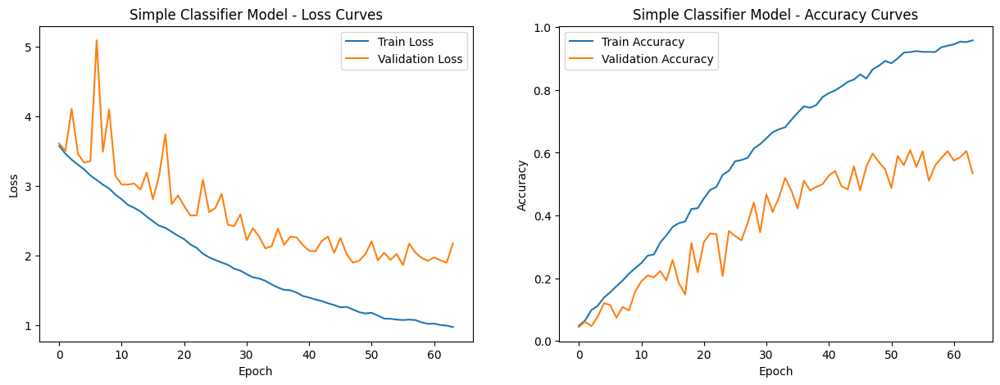

In [ ]:
simpleClassifierModel = SimpleClassifier_Model(
    num_classes=train_dataset.get_num_classes()
).to(device)
simpleClassifierModel.load_state_dict(
    torch.load("./drive/MyDrive/AssignmentsIPCV/best_SimpleClassifier.pth")
)

test_loss, test_acc = evaluate(simpleClassifierModel, test_loader, criterion, device)
print(f"Accuracy on test set: {test_acc}")

simpleClassifierModel_history = load_history_from_csv(
    "./drive/MyDrive/AssignmentsIPCV/history_SimpleClassifier.csv"
)

plot_history(simpleClassifierModel_history, "Simple Classifier Model")


The training curves show a consistent decrease in loss and a strong upward trend in accuracy, indicating that the model learns effectively on the training set. However, the widening gap between training and validation accuracy reveals moderate overfitting.
Overall, while the simplified classifier allows for faster convergence, it comes at the cost of weaker generalization. The results emphasize that the deeper, regularized classifier in the original model is necessary to balance learning capacity and robustness to unseen data.

## Analysis

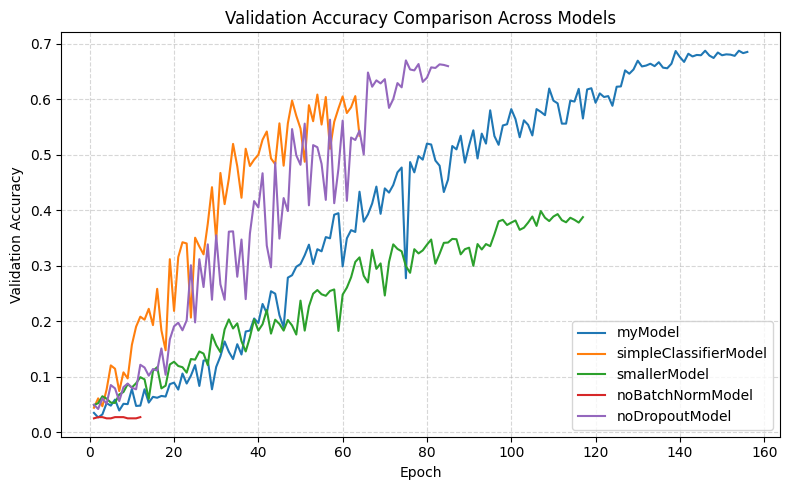

In [ ]:
histories = {}
histories["myModel"] = load_history_from_csv('./drive/MyDrive/AssignmentsIPCV/history_MyModel.csv')
histories["simpleClassifierModel"] = load_history_from_csv('./drive/MyDrive/AssignmentsIPCV/history_SimpleClassifier.csv')
histories["smallerModel"] = load_history_from_csv('./drive/MyDrive/AssignmentsIPCV/history_Smaller.csv')
histories["noBatchNormModel"] = load_history_from_csv('./drive/MyDrive/AssignmentsIPCV/history_NoBatchNorm.csv')
histories["noDropoutModel"] = load_history_from_csv('./drive/MyDrive/AssignmentsIPCV/history_NoDropout.csv')

# Create the plot

plt.figure(figsize=(8, 5))

for name, hist in histories.items():
    epochs = np.arange(1, len(hist["val_acc"]) + 1)
    plt.plot(epochs, hist["val_acc"], label=name)
plt.title("Validation Accuracy Comparison Across Models")
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()



- **myModel**: Shows steady and consistent improvement, eventually achieving the highest validation accuracy ~0.7, indicating good generalization and stable convergence.

- **simpleClassifierModel**: Learns quickly at the beginning but plateaus early around 0.6, suggesting limited capacity due to a simplified classifier head.

- **smallerModel**: Improves slowly and saturates around 0.35–0.4, confirming clear underfitting caused by reduced depth and representational power.

- **noBatchNormModel**: Fails to learn meaningful patterns, remaining near random accuracy, showing the essential stabilizing role of Batch Normalization.

- **noDropoutModel**: Rises rapidly but exhibits strong fluctuations and early saturation, typical of overfitting caused by the lack of Dropout regularization.

In [ ]:
myModel = MyModel(num_classes=train_dataset.get_num_classes()).to(device)
myModel.load_state_dict(torch.load('./drive/MyDrive/AssignmentsIPCV/best_MyModel.pth'))

simpleClassifierModel = SimpleClassifier_Model(num_classes=train_dataset.get_num_classes()).to(device)
simpleClassifierModel.load_state_dict(torch.load('./drive/MyDrive/AssignmentsIPCV/best_SimpleClassifier.pth'))

smallerModel = Smaller_Model(num_classes=train_dataset.get_num_classes()).to(device)
smallerModel.load_state_dict(torch.load('./drive/MyDrive/AssignmentsIPCV/best_Smaller.pth'))

noBatchNormModel = NoBatchNorm_Model(num_classes=train_dataset.get_num_classes()).to(device)
noBatchNormModel.load_state_dict(torch.load('./drive/MyDrive/AssignmentsIPCV/best_NoBatchNorm.pth'))

noDropoutModel = NoDropout_Model(num_classes=train_dataset.get_num_classes()).to(device)
noDropoutModel.load_state_dict(torch.load('./drive/MyDrive/AssignmentsIPCV/best_NoDropout.pth'))

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

In [ ]:
results = {}
for model in tqdm([myModel, simpleClassifierModel, smallerModel, noBatchNormModel, noDropoutModel]):
  model_name = model.__class__.__name__
  results[model_name] = {}
  _, results[model_name]["eval_score"] = evaluate(model, val_loader, criterion, device)
  _, results[model_name]["test_score"] = evaluate(model, test_loader, criterion, device)
  results[model_name]["eval_score"] = round(results[model_name]["eval_score"], 4)*100
  results[model_name]["test_score"] = round(results[model_name]["test_score"], 4)*100


  0%|          | 0/5 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Grouped bar chart visualization

,MyModel,SimpleClassifier_Model,Smaller_Model,NoBatchNorm_Model,NoDropout_Model
eval_score,68.76,60.85,39.86,2.73,67.01
test_score,70.64,61.00,43.55,2.71,69.72


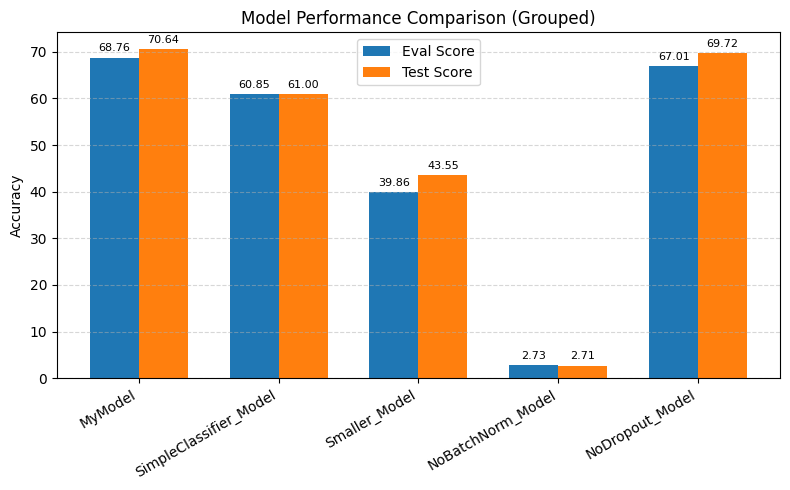

In [ ]:
df = pd.DataFrame(results, index=["eval_score", "test_score"])
display(df)

fig, ax = plt.subplots(figsize=(8, 5))

x = np.arange(len(df.columns))
width = 0.35

# Plot bars

bars1 = ax.bar(x - width / 2, df.loc["eval_score"], width, label="Eval Score")
bars2 = ax.bar(x + width / 2, df.loc["test_score"], width, label="Test Score")

ax.set_ylabel("Accuracy")
ax.set_title("Model Performance Comparison (Grouped)")
ax.set_xticks(x)
ax.set_xticklabels(df.columns, rotation=30, ha="right")
ax.legend()
ax.grid(axis="y", linestyle="--", alpha=0.5)

# Annotate bar values

for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(
            f"{height:.2f}",
            xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=8,
        )
plt.tight_layout()


It’s evident from the results that each component of the architecture plays a fundamental role in achieving strong performance. Even though Dropout does not directly raise the final accuracy, it significantly stabilizes the training process and prevents the model from relying on fragile patterns. Overall, this is a solid ablation study that clearly shows the model is well-designed and not overengineered.

# Part 2: fine-tune an existing network

Your goal is to fine-tune a pretrained ResNet-18 model on `OxfordPetDataset`. Use the implementation provided by PyTorch, i.e. the opposite of part 1. Specifically, use the PyTorch ResNet-18 model pretrained on ImageNet-1K (V1). Divide your fine-tuning into two parts:

2A. First, fine-tune the ResNet-18 with the same training hyperparameters you used for your best model in part 1.

2B. Then, tweak the training hyperparameters in order to increase the accuracy on the test split. Justify your choices by analyzing the training plots and/or citing sources that guided you in your decisions — papers, blog posts, YouTube videos, or whatever else you may find useful. You should consider yourselves satisfied once you obtain a classification accuracy on the test split of ~90%.

##2A

In [ ]:
resnet18_ft_A = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

num_classes = train_dataset.get_num_classes()
resnet18_ft_A.fc = nn.Linear(resnet18_ft_A.fc.in_features, num_classes)

resnet18_ft_A = resnet18_ft_A.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 211MB/s]


In [ ]:
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = optim.Adam(resnet18_ft_A.parameters(), lr=1e-3, weight_decay=2e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=4, min_lr=1e-7, threshold=1e-4
)

resnet18_ft_A_history = train_loop(
    resnet18_ft_A,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    100,
    device,
    "drive/MyDrive/AssignmentsIPCV",
    model_name="resnet18_ft_A",
    early_stopping_patience=5,
)


--- Epoch 1/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.7679, Train Acc: 0.6299
Val Loss: 2.0906, Val Acc: 0.5360
Learning Rate: 0.001000
New best model saved with accuracy: 0.5360
--- Epoch 2/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.3092, Train Acc: 0.7948
Val Loss: 1.9111, Val Acc: 0.5742
Learning Rate: 0.001000
New best model saved with accuracy: 0.5742
--- Epoch 3/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.1203, Train Acc: 0.8645
Val Loss: 1.7305, Val Acc: 0.6418
Learning Rate: 0.001000
New best model saved with accuracy: 0.6418
--- Epoch 4/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0529, Train Acc: 0.8921
Val Loss: 1.8737, Val Acc: 0.6145
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 5/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0296, Train Acc: 0.8964
Val Loss: 1.8162, Val Acc: 0.6216
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 6/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9902, Train Acc: 0.9144
Val Loss: 1.5696, Val Acc: 0.6914
Learning Rate: 0.001000
New best model saved with accuracy: 0.6914
--- Epoch 7/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9288, Train Acc: 0.9419
Val Loss: 1.6121, Val Acc: 0.6881
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 8/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8888, Train Acc: 0.9539
Val Loss: 1.6853, Val Acc: 0.6658
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 9/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8957, Train Acc: 0.9518
Val Loss: 1.4961, Val Acc: 0.7296
Learning Rate: 0.001000
New best model saved with accuracy: 0.7296
--- Epoch 10/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8885, Train Acc: 0.9526
Val Loss: 1.5853, Val Acc: 0.6947
Learning Rate: 0.001000
No improvement for 1 epoch(s)
--- Epoch 11/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8701, Train Acc: 0.9545
Val Loss: 1.5609, Val Acc: 0.7159
Learning Rate: 0.001000
No improvement for 2 epoch(s)
--- Epoch 12/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8573, Train Acc: 0.9638
Val Loss: 1.5388, Val Acc: 0.7126
Learning Rate: 0.001000
No improvement for 3 epoch(s)
--- Epoch 13/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8519, Train Acc: 0.9662
Val Loss: 1.6066, Val Acc: 0.6957
Learning Rate: 0.001000
No improvement for 4 epoch(s)
--- Epoch 14/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8494, Train Acc: 0.9659
Val Loss: 1.5214, Val Acc: 0.7372
Learning Rate: 0.001000
>>> Learning rate reduced from 0.001000 to 0.000500
New best model saved with accuracy: 0.7372
--- Epoch 15/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7802, Train Acc: 0.9861
Val Loss: 1.3132, Val Acc: 0.7901
Learning Rate: 0.000500
New best model saved with accuracy: 0.7901
--- Epoch 16/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7334, Train Acc: 0.9965
Val Loss: 1.2698, Val Acc: 0.8059
Learning Rate: 0.000500
New best model saved with accuracy: 0.8059
--- Epoch 17/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7223, Train Acc: 0.9978
Val Loss: 1.2675, Val Acc: 0.8108
Learning Rate: 0.000500
New best model saved with accuracy: 0.8108
--- Epoch 18/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7123, Train Acc: 0.9984
Val Loss: 1.2479, Val Acc: 0.8184
Learning Rate: 0.000500
New best model saved with accuracy: 0.8184
--- Epoch 19/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7093, Train Acc: 0.9981
Val Loss: 1.2520, Val Acc: 0.8135
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 20/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7083, Train Acc: 0.9984
Val Loss: 1.3149, Val Acc: 0.7972
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 21/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.7047, Train Acc: 0.9989
Val Loss: 1.2801, Val Acc: 0.8059
Learning Rate: 0.000500
No improvement for 3 epoch(s)
--- Epoch 22/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.6986, Train Acc: 0.9995
Val Loss: 1.2859, Val Acc: 0.8059
Learning Rate: 0.000500
No improvement for 4 epoch(s)
--- Epoch 23/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.6997, Train Acc: 0.9997
Val Loss: 1.2410, Val Acc: 0.8261
Learning Rate: 0.000500
New best model saved with accuracy: 0.8261
--- Epoch 24/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.6981, Train Acc: 1.0000
Val Loss: 1.2275, Val Acc: 0.8277
Learning Rate: 0.000500
New best model saved with accuracy: 0.8277
--- Epoch 25/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.6984, Train Acc: 0.9997
Val Loss: 1.2564, Val Acc: 0.8119
Learning Rate: 0.000500
No improvement for 1 epoch(s)
--- Epoch 26/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.6960, Train Acc: 0.9995
Val Loss: 1.2414, Val Acc: 0.8250
Learning Rate: 0.000500
No improvement for 2 epoch(s)
--- Epoch 27/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.6941, Train Acc: 0.9995
Val Loss: 1.2477, Val Acc: 0.8190
Learning Rate: 0.000500
No improvement for 3 epoch(s)
--- Epoch 28/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.6972, Train Acc: 0.9997
Val Loss: 1.2790, Val Acc: 0.8152
Learning Rate: 0.000500
No improvement for 4 epoch(s)
--- Epoch 29/100 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.6988, Train Acc: 0.9992
Val Loss: 1.2917, Val Acc: 0.8010
Learning Rate: 0.000500
>>> Learning rate reduced from 0.000500 to 0.000250
No improvement for 5 epoch(s)

Early stopping triggered after 29 epochs (no improvement for 5 epochs)
Training finished.

Training history saved to: device/MyDrive/AssignmentsIPCV/history_resnet18ft.csv
Best validation accuracy: 0.8277


Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Accuracy on test set: 0.8347778981581798


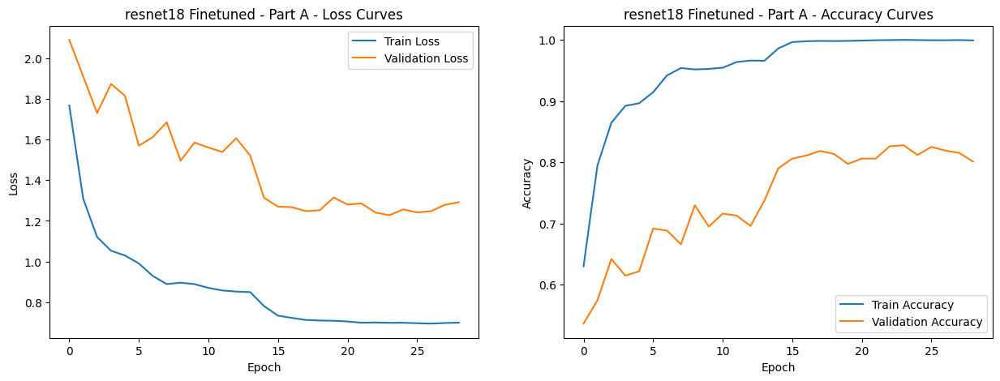

In [ ]:
resnet18_ft_A = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
resnet18_ft_A.fc = nn.Linear(resnet18_ft_A.fc.in_features, num_classes)
resnet18_ft_A = resnet18_ft_A.to(device)

resnet18_ft_A.load_state_dict(
    torch.load("./drive/MyDrive/AssignmentsIPCV/best_resnet18_ft_A.pth")
)

test_loss, test_acc = evaluate(resnet18_ft_A, test_loader, criterion, device)
print(f"Accuracy on test set: {test_acc}")

resnet18_ft_A_history = load_history_from_csv(
    "./drive/MyDrive/AssignmentsIPCV/history_resnet18_ft_A.csv"
)

plot_history(resnet18_ft_A_history, "resnet18 Finetuned - Part A")


This time, the fine-tuned ResNet18 leverages transfer learning, utilizing pre-trained weights from ImageNet that already act as a robust feature extractor. This allows the model to bypass the initial feature learning phase (evident in the high starting accuracy) and focus only on adapting these existing representations to our classes, leading to faster convergence and better performance.

##2B

Listed below are the most important choices made to fine-tune the network.

- Discriminative Fine-Tuning

  The backbone uses a lower learning rate because pre-trained ImageNet features are already highly informative and should be fine-tuned conservatively.
  The randomly initialized head requires a higher learning rate to learn task-specific patterns quickly. This differential approach balances preserving general features with adapting to our domain.

  [Source](https://medium.com/@digitalconsumer777/transfer-learning-in-deep-learning-save-time-and-boost-accuracy-632e6218433a)

- Optimizer Configuration

  AdamW is a smarter version of Adam as it decouples weight decay from the gradient update step. Instead of adding weight decay to the loss function, it applies weight decay directly during the parameter update, leading to more consistent regularization and better generalization.

  [Source](https://yassin01.medium.com/adam-vs-adamw-understanding-weight-decay-and-its-impact-on-model-performance-b7414f0af8a1)

All parameters used have been tuned

In [ ]:
resnet18_ft_B = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
num_ftrs = resnet18_ft_B.fc.in_features
num_classes = train_dataset.get_num_classes()

resnet18_ft_B.fc = nn.Linear(num_ftrs, num_classes)
resnet18_ft_B = resnet18_ft_B.to(device)

# Discriminative Fine-Tuning

backbone_params = []
head_params = []

for name, param in resnet18_ft_B.named_parameters():
    if "fc" in name:
        head_params.append(param)
    else:
        backbone_params.append(param)
optimizer_ft = optim.AdamW(
    [{"params": backbone_params, "lr": 8e-5}, {"params": head_params, "lr": 4e-4}],
    weight_decay=4e-2,
)

# Slightly higher label smoothing

criterion = nn.CrossEntropyLoss(label_smoothing=0.12)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_ft, mode="min", factor=0.5, patience=4, min_lr=1e-7, threshold=1e-4
)


In [ ]:
history = train_loop(
    resnet18_ft_B,
    train_loader,
    val_loader,
    criterion,
    optimizer_ft,
    scheduler,
    epochs=40,
    device=device,
    save_dir="drive/MyDrive/AssignmentsIPCV",
    model_name="resnet18_ft_B",
    early_stopping_patience=15,
)


--- Epoch 1/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 2.1652, Train Acc: 0.6182
Val Loss: 1.4481, Val Acc: 0.8190
New best model saved with accuracy: 0.8190
--- Epoch 2/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.2021, Train Acc: 0.9065
Val Loss: 1.2896, Val Acc: 0.8544
New best model saved with accuracy: 0.8544
--- Epoch 3/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 1.0660, Train Acc: 0.9463
Val Loss: 1.2568, Val Acc: 0.8473
No improvement for 1 epoch(s)
--- Epoch 4/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9929, Train Acc: 0.9703
Val Loss: 1.2317, Val Acc: 0.8637
New best model saved with accuracy: 0.8637
--- Epoch 5/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9445, Train Acc: 0.9787
Val Loss: 1.2400, Val Acc: 0.8582
No improvement for 1 epoch(s)
--- Epoch 6/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.9142, Train Acc: 0.9888
Val Loss: 1.2358, Val Acc: 0.8610
No improvement for 2 epoch(s)
--- Epoch 7/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8849, Train Acc: 0.9948
Val Loss: 1.2299, Val Acc: 0.8686
New best model saved with accuracy: 0.8686
--- Epoch 8/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8695, Train Acc: 0.9973
Val Loss: 1.2345, Val Acc: 0.8686
No improvement for 1 epoch(s)
--- Epoch 9/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8604, Train Acc: 0.9978
Val Loss: 1.2364, Val Acc: 0.8659
No improvement for 2 epoch(s)
--- Epoch 10/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8572, Train Acc: 0.9984
Val Loss: 1.2351, Val Acc: 0.8664
No improvement for 3 epoch(s)
--- Epoch 11/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8428, Train Acc: 0.9995
Val Loss: 1.2347, Val Acc: 0.8735
New best model saved with accuracy: 0.8735
--- Epoch 12/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8370, Train Acc: 0.9997
Val Loss: 1.2449, Val Acc: 0.8642
>>> Learning rate changed from 0.000080 to 0.000040
No improvement for 1 epoch(s)
--- Epoch 13/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8329, Train Acc: 0.9992
Val Loss: 1.2251, Val Acc: 0.8680
No improvement for 2 epoch(s)
--- Epoch 14/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8277, Train Acc: 1.0000
Val Loss: 1.2205, Val Acc: 0.8740
New best model saved with accuracy: 0.8740
--- Epoch 15/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8262, Train Acc: 1.0000
Val Loss: 1.2221, Val Acc: 0.8735
No improvement for 1 epoch(s)
--- Epoch 16/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8246, Train Acc: 1.0000
Val Loss: 1.2223, Val Acc: 0.8735
No improvement for 2 epoch(s)
--- Epoch 17/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8227, Train Acc: 0.9997
Val Loss: 1.2288, Val Acc: 0.8724
No improvement for 3 epoch(s)
--- Epoch 18/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8230, Train Acc: 1.0000
Val Loss: 1.2299, Val Acc: 0.8708
No improvement for 4 epoch(s)
--- Epoch 19/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8211, Train Acc: 0.9997
Val Loss: 1.2385, Val Acc: 0.8697
>>> Learning rate changed from 0.000040 to 0.000020
No improvement for 5 epoch(s)
--- Epoch 20/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8184, Train Acc: 1.0000
Val Loss: 1.2330, Val Acc: 0.8708
No improvement for 6 epoch(s)
--- Epoch 21/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8181, Train Acc: 1.0000
Val Loss: 1.2377, Val Acc: 0.8724
No improvement for 7 epoch(s)
--- Epoch 22/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8142, Train Acc: 1.0000
Val Loss: 1.2327, Val Acc: 0.8746
New best model saved with accuracy: 0.8746
--- Epoch 23/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8158, Train Acc: 1.0000
Val Loss: 1.2305, Val Acc: 0.8746
No improvement for 1 epoch(s)
--- Epoch 24/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8146, Train Acc: 1.0000
Val Loss: 1.2342, Val Acc: 0.8762
>>> Learning rate changed from 0.000020 to 0.000010
New best model saved with accuracy: 0.8762
--- Epoch 25/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8136, Train Acc: 1.0000
Val Loss: 1.2313, Val Acc: 0.8740
No improvement for 1 epoch(s)
--- Epoch 26/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8121, Train Acc: 1.0000
Val Loss: 1.2322, Val Acc: 0.8740
No improvement for 2 epoch(s)
--- Epoch 27/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8109, Train Acc: 1.0000
Val Loss: 1.2337, Val Acc: 0.8735
No improvement for 3 epoch(s)
--- Epoch 28/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8114, Train Acc: 1.0000
Val Loss: 1.2302, Val Acc: 0.8762
No improvement for 4 epoch(s)
--- Epoch 29/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8105, Train Acc: 1.0000
Val Loss: 1.2316, Val Acc: 0.8757
>>> Learning rate changed from 0.000010 to 0.000005
No improvement for 5 epoch(s)
--- Epoch 30/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8104, Train Acc: 1.0000
Val Loss: 1.2322, Val Acc: 0.8746
No improvement for 6 epoch(s)
--- Epoch 31/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8100, Train Acc: 1.0000
Val Loss: 1.2317, Val Acc: 0.8751
No improvement for 7 epoch(s)
--- Epoch 32/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8107, Train Acc: 1.0000
Val Loss: 1.2312, Val Acc: 0.8746
No improvement for 8 epoch(s)
--- Epoch 33/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8097, Train Acc: 1.0000
Val Loss: 1.2332, Val Acc: 0.8735
No improvement for 9 epoch(s)
--- Epoch 34/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8103, Train Acc: 1.0000
Val Loss: 1.2318, Val Acc: 0.8751
>>> Learning rate changed from 0.000005 to 0.000003
No improvement for 10 epoch(s)
--- Epoch 35/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8090, Train Acc: 1.0000
Val Loss: 1.2308, Val Acc: 0.8751
No improvement for 11 epoch(s)
--- Epoch 36/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8085, Train Acc: 1.0000
Val Loss: 1.2297, Val Acc: 0.8773
New best model saved with accuracy: 0.8773
--- Epoch 37/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8086, Train Acc: 1.0000
Val Loss: 1.2318, Val Acc: 0.8740
No improvement for 1 epoch(s)
--- Epoch 38/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8087, Train Acc: 1.0000
Val Loss: 1.2328, Val Acc: 0.8740
No improvement for 2 epoch(s)
--- Epoch 39/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8083, Train Acc: 1.0000
Val Loss: 1.2338, Val Acc: 0.8719
>>> Learning rate changed from 0.000003 to 0.000001
No improvement for 3 epoch(s)
--- Epoch 40/40 ---


Training:   0%|          | 0/58 [00:00<?, ?it/s]

Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Train Loss: 0.8085, Train Acc: 1.0000
Val Loss: 1.2331, Val Acc: 0.8795
New best model saved with accuracy: 0.8795
Training finished.

Training history saved to: drive/MyDrive/AssignmentsIPCV/history_ResNet_v5b.csv
Best validation accuracy: 0.8795


Validation:   0%|          | 0/29 [00:00<?, ?it/s]

Accuracy on test set: 0.8954496208017335


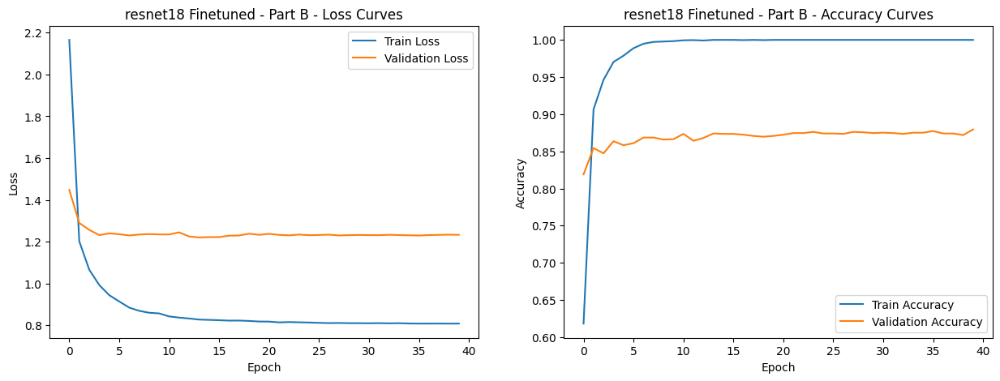

In [ ]:
resnet18_ft_B = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
num_classes = train_dataset.get_num_classes()

resnet18_ft_B.fc = nn.Linear(resnet18_ft_B.fc.in_features, num_classes)
resnet18_ft_B = resnet18_ft_B.to(device)

resnet18_ft_B.load_state_dict(
    torch.load("./drive/MyDrive/AssignmentsIPCV/best_resnet18_ft_B.pth")
)
criterion = nn.CrossEntropyLoss(label_smoothing=0)

test_loss, test_acc = evaluate(resnet18_ft_B, test_loader, criterion, device)
print(f"Accuracy on test set: {test_acc}")

resnet18_ft_B_history = load_history_from_csv(
    "./drive/MyDrive/AssignmentsIPCV/history_resnet18_ft_B.csv"
)

plot_history(resnet18_ft_B_history, "resnet18 Finetuned - Part B")


The implemented fine-tuning strategy demonstrates effectiveness through the combination of complementary regularization techniques.

Throughout the experimentation phase, multiple alternative approaches were explored to optimize model performance. Various configurations were tested, including deeper classification heads with additional hidden layers, dropout regularization, alternative learning rate scheduling strategies, and different optimizer choices.
While these alternatives showed promise in certain aspects, the current configuration produced the best validation performance.

Critically, the optimal model was discovered by continuing training well beyond the point of 100% training accuracy, a counterintuitive but theoretically grounded approach. This phenomenon, known as benign overfitting, reveals that modern overparameterized neural networks can achieve perfect training fit while simultaneously improving validation performance. In the classical machine learning paradigm, reaching 100% training accuracy would signal catastrophic overfitting and immediate performance degradation. However, deep neural networks can interpolate training data in ways that remain aligned with the underlying data distribution.